In [207]:
import os
from scipy.io import loadmat
import cv2
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed
from mtcnn import MTCNN
import fcntl
import shutil
import math
from collections import Counter
import mplcursors
import albumentations as A
import seaborn as sns
import random
import csv
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd

os.environ["OPENCV_IO_ENABLE_OPENEXR"]="1"

# Data Understand

In [ ]:
# Đường dẫn đến các file .mat
# dir_path = '../Photometric_DB/2220/2007-12-04_12-11-40'
# dir_path = '../Photometric_DB/2224/2007-12-07_10-33-33'
dir_path = '../Photometric_DB/1001/2008-03-27_16-25-37'
# dir_path = '../Photometric_DB/1002/2008-02-25_17-34-06'
# dir_path = '../Photometric_DB/1001/2009-07-09_13-25-40'

sn_path = os.path.join(dir_path, 'sn.mat')
z_path = os.path.join(dir_path, 'z.mat')
depthmap_path = os.path.join(dir_path, 'albedo.mat')

# Load dữ liệu từ các file .mat
sn_data = loadmat(sn_path)
z_data = loadmat(z_path)
albedo_data = loadmat(depthmap_path)

# Hiển thị các keys trong các file .mat
print(sn_data.keys())
print(z_data.keys())
print(albedo_data.keys())

In [ ]:
px = sn_data['px']
py = sn_data['py']
# Trong phương pháp photometric stereo chỉ có 2 thành phần px và py. Tuy nhiên từ đó ta hoàn toàn có thể tính được pz theo định lý pytago, pz trong dataset này là kết quả của điều này.
pz = sn_data['pz']

z = z_data['z']  # Độ sâu của mỗi điểm ảnh
albedo = albedo_data['a']  # Hiệu suất phản chiếu của mỗi điểm ảnh

In [ ]:
# print(px)
print(np.min(px))
print(np.max(px))
print(np.shape(px))
# Kết luận: px và py là ma trận 2 chiều bằng kích thước ảnh. Biểu diễn normal vector của vật thể trong không gian gradient. 
# Và nó đã được chuẩn hóa để kích thước là 1. Đặc biệt nó có thể âm

plt.figure(figsize=(12,8))

plt.subplot(1,2,1)
plt.imshow(px, cmap='gray') # Do px, py là ma trận 2 chiều và được chuẩn hóa trong đoạn [0,1] nên có thể hiển thị grayscale
plt.title('Pháp tuyến px')
plt.colorbar()
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(py, cmap='gray') # Do px, py là ma trận 2 chiều và được chuẩn hóa trong đoạn [0,1] nên có thể hiển thị grayscale
plt.title('Pháp tuyến py')
plt.colorbar()
plt.axis('off')

plt.show()
# Các giá trị px, py nằm trong khoảng [-1;1]

In [ ]:
pz_computed = np.sqrt(1 - (px**2 + py**2))

# So sánh với giá trị pz thực tế
if np.allclose(pz, pz_computed):
    print("pz tuân theo định lý Pythagoras từ px và py.")
else:
    print("pz không tuân theo định lý Pythagoras từ px và py.")

# Kết luận: Bản thân 1 vector trong hệ gradient space được biểu diễn bởi (px,py) và ánh xạ duy nhất đến 1 vector trong không gian Oxyz nên không cần có pz. pz được suy ra từ px và py, trong dataset họ tính thêm vào

plt.imshow(pz, cmap='gray')
plt.title('Pháp tuyến pz')
plt.colorbar()
plt.axis('off')
plt.show()

In [ ]:
normal_map = cv2.merge([pz, -px, py])

# Chuẩn hóa các giá trị vector vào khoảng [0, 1] 
# Khi chuẩn hóa về [0, 1], dữ liệu sẽ phù hợp với nhiều mô hình học sâu hơn, đặc biệt là các mô hình CNN. 
#   Vì hầu hết các mô hình đều giả định input là ảnh RGB có giá trị trong khoảng [0,1] hoặc [0, 255]
#   Các hàm Relu sẽ hoạt động tốt hơn khi dữ liệu không có giá trị âm
#   Dễ dàng tích hợp với các pipeline xử lý ảnh tiêu chuẩn
# Giữ nguyên [-1,1]
#   Giữ lại thông tin normal map 1 cách chuẩn xác hơn, thậm chí trong quá trình check ảnh có thể nhìn ảnh đẹp/rõ ràng hơn. Nhưng tóm lại khi vào model nó vẫn là tensor.
#   Không thích hợp để fine-tunining mô hình đã được pre-trained. Vì đa số mặc định đầu vào khi train không có số dương,

normal_map = (normal_map + 1) / 2
normal_map = normal_map.astype(np.float32)

cv2.imwrite('./normalmap.exr', normal_map)

normal_map= cv2.imread('./normalmap.exr', cv2.IMREAD_UNCHANGED)

# pylot không hỗ trợ đọc ảnh exr mà mặc định nó đọc ảnh RGB. Do đó khi gặp các biến âm, matplotlib tự động bỏ hoặc làm gì đó.
# Do đó visualize ảnh exr thường không cho cái nhìn chính xác mà ta phải cài tool và đọc ảnh bên ngoài.
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(normal_map, cv2.COLOR_BGR2RGB))
plt.title('Normal Map')
plt.colorbar()
plt.axis('off')

img0_path = os.path.join(dir_path, 'im0.bmp')
img0 = cv2.imread(img0_path)

# print(np.min(img0))
# print(np.max(img0))
# print(np.max(normal_map))
# print(np.min(normal_map))

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
plt.axis('off') # Tắt trục tọa độ
plt.title('Image 0')
plt.colorbar()

plt.show()

Tại sao lại lưu ảnh dưới dạng exr ?
- Deepmap trong photometric stereo là 1 bản đồ mô tả độ sâu của vật thể . Nó là 1 ma trận 2 chiều và giá trị các phần tử là số thực có thể âm và không có min và max xác định, tùy thuộc vào điểm mà bạn chọn làm mốc tính độ sâu.
- png: lưu giá trị dưới dạng số nguyên 8 bit (0-255). Điều này có nghĩa nếu dùng nó để lưu depth map thì các giá trị pixel của ảnh sẽ được normalize. Điều này làm sai lệch ý nghĩa độ sâu của ảnh.
- jpg: cũng lưu trữ ảnh dưới dạng số nguyên. Nhưng nó còn nèn ảnh, nó sử dụng kernel có kích thước 8*8 và chuyển đổi ảnh sang không gian màu YcbCr, ... => Mặc dù ảnh nhẹ hơn PNG nhưng độ chính xác của ảnh, thông tin 3D mà ảnh mang lại còn bị giảm mạnh hơn so với ảnh PNG
- exr: lưu hình ảnh ở dạng số thực. Phù hợp để lưu trữ depth map. Định dạng này không convert hay chuẩn hóa gì cả nên cung cấp thông tin chính xác hơn về độ sâu của vật thể. Được sử dụng rất nhiều trong các ứng dụng sản xuất chuyên nghiệp và độ họa 3D.

Lưu ý khi làm việc với ảnh ở định dạng exr:
- opencv mặc định tắt khả năng lưu numpy ở dạng exr, cần bật nó lên và convert dtype của numpy về float32 thì mới save được.
```sh
os.environ["OPENCV_IO_ENABLE_OPENEXR"]="1"
normal_map = normal_map.astype(np.float32)
```
- opencv mặc định sẽ convert ảnh về BRG space nên cần tắt nó đi khi đọc ảnh exr
```sh
img = cv2.imread('path_to_your_file.exr', cv2.IMREAD_UNCHANGED)
```
- opencv và matplot không hỗ trợ show ảnh exr. Muốn nhìn chính xác normal phải cài phần mềm thứ 3 về mới nhìn được, hình mà matplot lib show ra ở trên là sai. Trong Ubuntu phần mềm phổ biến nhất là DIV.

In [ ]:
# print(z)
# print(np.min(z))
# print(np.max(z))
# print(np.shape(z))
# Kết luận: Deepth map Z là ma trận 2 chiều có shape bằng size của ảnh. Giá trị nhỏ nhất của deepth map là 0, nghĩa là mốc được chọn làm mốc để tính tích phân là pixel có độ sâu thấp nhất.
cv2.imwrite('./albedo.exr', z.astype(np.float32))

dep = cv2.imread('./albedo.exr', cv2.IMREAD_UNCHANGED)

print(np.min(dep))
print(np.max(dep))
print(np.shape(dep))

plt.imshow(dep, cmap='gray')
plt.title('Depth map')
plt.axis('off')

plt.show()

In [ ]:
# print(albedo)

print(np.min(albedo))
print(np.max(albedo))
print(np.shape(albedo))

# Kết luận: albedo là 1 ma trận 2 chiều đã được hiệu chỉnh về [0, 255]. Đây là ảnh mà không bị phụ thuộc bởi nguồn sáng"

cv2.imwrite('./albedo.exr', albedo.astype(np.float32))

albedo = cv2.imread('./albedo.exr', cv2.IMREAD_UNCHANGED)

print(np.min(albedo))
print(np.max(albedo))
print(np.shape(albedo))

plt.imshow(albedo, cmap='gray')
plt.title('albedo gray')
plt.axis('off')
plt.colorbar()
plt.show()

In [ ]:
im0 = cv2.imread(os.path.join(dir_path, 'im0.bmp'))

cv2.imwrite('im0.bmp', im0)

im0_saved = cv2.imread('im0.bmp')

plt.subplot(1,2,1)
plt.axis('off')
plt.title('Origin Image')
plt.imshow(cv2.cvtColor(im0, cv2.COLOR_BGR2RGB))

plt.subplot(1,2,2)
plt.axis('off')
plt.title('Saved Image')
plt.imshow(cv2.cvtColor(im0_saved, cv2.COLOR_BGR2RGB))

plt.show()

# Preprocessing

## 0. Rollback dataset to origin

In [4]:
photometric_db = './tmp/Photometric_DB'

num_cpus = 14

files_to_keep = [
    'im0.bmp', 'im1.bmp', 'im2.bmp', 'im3.bmp', 
    'LightSource.m', 'metadata.txt', 'metadatall.txt', 
    'albedo.mat', 'z.mat', 'sn.mat',
    'albedo.exr', 'normalmap.exr', 'depthmap.exr',
    'albedo_crop.exr', 'normalmap_crop.exr', 'depthmap_crop.exr'
]

In [5]:
import os
from concurrent.futures import ProcessPoolExecutor

def delete_unwanted_files(seesion_path):
    for filename in os.listdir(seesion_path):
        if filename not in files_to_keep:
            file_path = os.path.join(seesion_path, filename)
            os.remove(file_path)
            
def process_each_session(id_path):
    for session in os.listdir(id_path):
        seesion_path = os.path.join(id_path, session)
        if os.path.isdir(seesion_path):
            delete_unwanted_files(seesion_path)

def rollback_dataset(num_cpus):
    with ProcessPoolExecutor(max_workers=num_cpus) as executor:
        for id in os.listdir(photometric_db):
            id_path = os.path.join(photometric_db, id)
            if os.path.isdir(id_path):
                # Gửi các tác vụ để xử lý song song
                executor.submit(process_each_session, id_path)

rollback_dataset(num_cpus)

## 1. Generate normalmap.exr, albedo.exr, depthmap.exr to dataset folder

In [38]:
photometric_db = '../Photometric_DB'

num_cpus = 14

In [ ]:
# Chứa các file nếu xử lý bị lỗi
error_file = 'error_people.txt'

def create_3d_images(session_path, id_dir):
    sn_path = os.path.join(session_path, 'sn.mat')
    z_path = os.path.join(session_path, 'z.mat')
    albedo_path = os.path.join(session_path, 'albedo.mat')
    
    error_messages = []

    if os.path.exists(sn_path) and os.path.exists(z_path) and os.path.exists(albedo_path):
        try:
            # Load dữ liệu từ các file .mat
            sn_data = loadmat(sn_path)
            z_data = loadmat(z_path)
            albedo_data = loadmat(albedo_path)
            
            # Trích xuất các thông tin cần thiết từ mat file
            px = sn_data['px']
            py = sn_data['py']
            pz = sn_data['pz']
            z = z_data['z']
            albedo = albedo_data['a']
            
            # Save các ảnh normal map
            try:
                normal_map = cv2.merge([pz, -px, py])
                normal_map = (normal_map + 1)/2
                normal_map = normal_map.astype(np.float32)
                normal_map_path = os.path.join(session_path, 'normalmap.exr')
                cv2.imwrite(normal_map_path, normal_map)
            except Exception as e:
                error_messages.append(f"{id_dir}: Error saving normal map: {repr(e)}")

            # Save các ảnh depth map
            try:
                z = z/255
                depth_map = z.astype(np.float32())
                depth_map_path = os.path.join(session_path, 'depthmap.exr')
                cv2.imwrite(depth_map_path, depth_map)
            except Exception as e:
                error_messages.append(f"{id_dir}: Error saving depth map: {repr(e)}")

            # Save các ảnh albedo map
            try:
                albedo = albedo / 255
                albedo_map = albedo.astype(np.float32())
                albedo_map_path = os.path.join(session_path, 'albedo.exr')
                cv2.imwrite(albedo_map_path, albedo_map)
            except Exception as e:
                error_messages.append(f"{id_dir}: Error saving albedo map: {repr(e)}")

            if error_messages:
                return "\n".join(error_messages)
            return None

        except Exception as e:
            return f"{id_dir}: Error loading .mat files: {repr(e)}"
    else:
        return f"{id_dir}: Missing files"

with ProcessPoolExecutor(max_workers=num_cpus) as executor:
    for people_dir in os.listdir(photometric_db):
        people_path = os.path.join(photometric_db, people_dir)
        if os.path.isdir(people_path):
            for session in os.listdir(people_path):
                source_session_path = os.path.join(people_path, session)
                executor.submit(create_3d_images, source_session_path, people_dir)

In [ ]:
session = '../Photometric_DB/1050/2008-02-28_14-58-14'

normalmap_path = '../3D_Dataset/Normal_Map/1001/2008-02-23_12-21-31.exr'
# depthmap_path = os.path.join(session, 'depthmap.exr')
# albedo_path = os.path.join(session, 'albedo.exr')

# Load ma trân ảnh về RGB color space
normal_map = cv2.imread(normalmap_path, cv2.IMREAD_UNCHANGED)
# depth_map = cv2.imread(depthmap_path, cv2.IMREAD_UNCHANGED)
# albedo = cv2.imread(albedo_path, cv2.IMREAD_UNCHANGED)

print(normal_map.shape)
# print(depth_map.shape)
# print(albedo.shape)

# plt.figure(figsize=(15,5))

# plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(normal_map, cv2.COLOR_BGR2RGB))
plt.title('Normal map')
plt.colorbar()
plt.axis('off')

# plt.subplot(1,3,2)
# plt.imshow(depth_map, cmap='gray')
# plt.title('Depth map')
# plt.colorbar()
# plt.axis('off')

# plt.subplot(1,3,3)
# plt.imshow(albedo, cmap='gray')
# plt.title('Albedo')
# plt.colorbar()
# plt.axis('off')

plt.show()

## 2. Face Detection

### Run mtcnn to auto face detect + aligment

In [6]:
photometric_db = './tmp/Photometric_DB'

num_cpus = 10

In [2]:
def log_to_file(filename, message):
    with open(filename, 'a') as file:
        fcntl.flock(file, fcntl.LOCK_EX)
        try:
            file.write(message + '\n')
        finally:
            fcntl.flock(file, fcntl.LOCK_UN)
            
def adjust_box(box, shape):
    x, y, width, height = box
    image_height, image_width = shape[:2]
    if width < height:
        tmp = height - width
        width = height
        x -= tmp // 2
        
        if x < 0:
            height = width = width - 2 * abs(x)
            y += abs(x)
            x = 0
            
        if (x+width) > image_width:
            tmp = (x+width - image_width)
            width = height = width - tmp
            x += tmp // 2 - 1
            y += tmp // 2 - 1
        
        if y < 0:
            height = width = width - 2 * abs(y)
            x += abs(y)
            y = 0
        
        if (y+height) > image_height:
            tmp = (y+height - image_height)
            height = width = height - tmp
            y += tmp // 2 - 1
            x += tmp // 2 - 1
    
    if height < width:
        tmp = width - height
        height = width
        y -= tmp // 2
        
        if y < 0:
            width = height = height - 2 * abs(y)
            x += abs(y)
            y = 0
        
        if (y+height) > image_height:
            tmp = (y+height - image_height)
            height = width = height - tmp
            y += tmp // 2 - 1
            x += tmp // 2 - 1
        
        if x < 0:
            width = height = height - 2 * abs(x)
            y += abs(x)
            x = 0
        
        if (x+width) > image_width:
            tmp = (x+width - image_width)
            width = height = width - tmp
            x += tmp // 2 - 1
            y += tmp // 2 - 1
            
    adjusted_box = [x, y, width, height]
    return adjusted_box

def crop_image(image, box, image_path):
    x, y, width, height = box

    face_crop = image[y:y + height, x:x + width]

    # Tạo tên file mới với hậu tố '_crop' trong cùng thư mục
    base, ext = os.path.splitext(image_path)
    new_image_path = f"{base}_mtcnn{ext}"

    # Lưu ảnh đã cắt
    if ext.lower() == '.bmp':
        cv2.imwrite(new_image_path, face_crop)
    elif ext.lower() == '.exr':
        cv2.imwrite(new_image_path, face_crop.astype(np.float32))

def detect_face_in_all_exr(session_path, detector):
    try:
        normalmap_path = os.path.join(session_path, 'normalmap.exr')
        albedo_path = os.path.join(session_path, 'albedo.exr')
        depthmap_path = os.path.join(session_path, 'depthmap.exr')
        
        normal_map = cv2.imread(normalmap_path, cv2.IMREAD_UNCHANGED)
        albedo = cv2.imread(albedo_path, cv2.IMREAD_UNCHANGED)
        depth_map = cv2.imread(depthmap_path, cv2.IMREAD_UNCHANGED)
        
        results = detector.detect_faces(cv2.cvtColor(albedo*255, cv2.COLOR_GRAY2RGB))
        if len(results) == 1:
            box = adjust_box(results[0]['box'], albedo.shape)
            crop_image(normal_map, box, normalmap_path)
            crop_image(albedo, box, albedo_path)
            crop_image(depth_map, box, depthmap_path)
            return True
        elif len(results) >=2:
            log_to_file('multi_face.txt', session_path)
            max_confidence_index = max(
                (i for i, res in enumerate(results) if 'confidence' in res and res['confidence'] >= 0.9),
                key=lambda i: results[i]['confidence'],
                default=None
            )

            max_confidence_box = results[max_confidence_index]['box'] if max_confidence_index is not None else None
            
            if max_confidence_box:
                box = adjust_box(max_confidence_box, albedo.shape)
                crop_image(normal_map, box, normalmap_path)
                crop_image(albedo, box, albedo_path)
                crop_image(depth_map, box, depthmap_path)
            return True
        im0_path = os.path.join(session_path, 'im0.bmp')
        im1_path = os.path.join(session_path, 'im1.bmp')
        im2_path = os.path.join(session_path, 'im2.bmp')
        im3_path = os.path.join(session_path, 'im3.bmp')
        bmp_paths = [im0_path, im1_path, im2_path, im3_path]
        for bmp_path in bmp_paths:
            image = cv2.imread(bmp_path)
            results = detector.detect_faces(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            if len(results) == 1:
                box = adjust_box(results[0]['box'], albedo.shape)
                crop_image(normal_map, box, normalmap_path)
                crop_image(albedo, box, albedo_path)
                crop_image(depth_map, box, depthmap_path)
                return True
            elif len(results) >=2:
                log_to_file('multi_face.txt', session_path)
                max_confidence_index = max(
                    (i for i, res in enumerate(results) if 'confidence' in res and res['confidence'] >= 0.9),
                    key=lambda i: results[i]['confidence'],
                    default=None
                )

                max_confidence_box = results[max_confidence_index]['box'] if max_confidence_index is not None else None
                
                if max_confidence_box:
                    box = adjust_box(max_confidence_box, albedo.shape)
                    crop_image(normal_map, box, normalmap_path)
                    crop_image(albedo, box, albedo_path)
                    crop_image(depth_map, box, depthmap_path)
                return True
        return False
    except Exception as e:
        raise e
        
def process_session(session_path, cpu_index):
    try:
        # Khởi tạo detector cho CPU cụ thể
        detector = MTCNN(device=f"CPU:{cpu_index}")

        # Gọi hàm detect cho từng định dạng
        if not detect_face_in_all_exr(session_path, detector):
            log_to_file('failed_crop.txt', session_path)
            print(f"Không detect được face trong session {session_path}.")

    except Exception as e:
        log_to_file('session_exception.txt', session_path)
        print(f"Xảy ra lỗi trong quá trình xử lý session {session_path}: {repr(e)}")
    finally:
        log_to_file('processed_sessions.txt', session_path)  # Ghi lại session đã xử lý dù có lỗi

cpu_index = 0
count = 1

# Đọc các session đã xử lý từ file checkpoint (nếu có)
processed_sessions = set()
if os.path.exists('processed_sessions.txt'):
    with open('processed_sessions.txt', 'r') as f:
        processed_sessions = set(f.read().splitlines())

# Thu thập tất cả session_path chưa được xử lý
session_paths_to_process = []
for id in os.listdir(photometric_db):
    id_path = os.path.join(photometric_db, id)
    if os.path.isdir(id_path):
        for session in os.listdir(id_path):
            source_session_path = os.path.join(id_path, session)
            # Chỉ thêm các session chưa xử lý vào danh sách
            if source_session_path not in processed_sessions:
                session_paths_to_process.append(source_session_path)

with ProcessPoolExecutor(max_workers=num_cpus) as executor:
    for source_session_path in session_paths_to_process:
        executor.submit(process_session, source_session_path, cpu_index)
        cpu_index = cpu_index % num_cpus
        cpu_index += 1
        count += 1

NameError: name 'photometric_db' is not defined

In [ ]:
albedo_path = './tmp/Photometric_DB/1004/2008-04-08_11-49-40/im0.bmp'
albedo = cv2.imread(albedo_path, cv2.IMREAD_UNCHANGED)
detector = MTCNN(device=f"CPU:0")
results = detector.detect_faces(cv2.cvtColor(albedo, cv2.COLOR_BGR2RGB))
results

[{'box': [175, 222, 337, 462],
  'confidence': 0.9833208322525024,
  'keypoints': {'nose': [349, 467],
   'mouth_right': [408, 565],
   'right_eye': [423, 379],
   'left_eye': [276, 392],
   'mouth_left': [293, 575]}}]

In [26]:
session = '../Photometric_DB/2156/2008-02-18_15-34-44'

im0 = cv2.cvtColor(cv2.imread(os.path.join(session, 'im0_crop.bmp')), cv2.COLOR_BGR2RGB)
im1 = cv2.cvtColor(cv2.imread(os.path.join(session, 'im1_crop.bmp')), cv2.COLOR_BGR2RGB)
im2 = cv2.cvtColor(cv2.imread(os.path.join(session, 'im2_crop.bmp')), cv2.COLOR_BGR2RGB)
im3 = cv2.cvtColor(cv2.imread(os.path.join(session, 'im3_crop.bmp')), cv2.COLOR_BGR2RGB)
normal_map = cv2.imread(os.path.join(session, 'normalmap_crop.exr'), cv2.IMREAD_UNCHANGED)
albedo = cv2.imread(os.path.join(session, 'albedo_crop.exr'), cv2.IMREAD_UNCHANGED)
depth_map = cv2.imread(os.path.join(session, 'depthmap_crop.exr'), cv2.IMREAD_UNCHANGED)

plt.figure(figsize=(12,6))

plt.subplot(2,4,1)
plt.imshow(im0)
plt.axis('off')

plt.subplot(2,4,2)
plt.imshow(im1)
plt.axis('off')

plt.subplot(2,4,3)
plt.imshow(im2)
plt.axis('off')

plt.subplot(2,4,4)
plt.imshow(im3)
plt.axis('off')

plt.subplot(2,4,5)
plt.imshow(cv2.cvtColor(normal_map, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2,4,6)
plt.imshow(depth_map, cmap='gray')
plt.axis('off')

plt.subplot(2,4,7)
plt.imshow(albedo, cmap='gray')
plt.axis('off')

plt.show()

[ WARN:0@1858.076] global loadsave.cpp:241 findDecoder imread_('../Photometric_DB/2156/2008-02-18_15-34-44/im0_crop.bmp'): can't open/read file: check file path/integrity


error: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


### Handle face aligment

Sau bước crop trên và kiểm tra ảnh, có 3/3159 session mà mtcnn không thể detect được. Thực hiện crop lại bằng tay.
- ../Photometric_DB/2023/2008-04-24_17-10-16
- ../Photometric_DB/2060/2008-02-21_16-56-43

Detect lỗi
- ../Photometric_DB/1205/2008-12-16_14-30-03
- ../Photometric_DB/2227/2007-12-04_12-22-06 (bỏ, tóc che nhiều quá)

In [3]:
def log_to_file(filename, message):
    with open(filename, 'a') as file:
        fcntl.flock(file, fcntl.LOCK_EX)
        try:
            file.write(message + '\n')
        finally:
            fcntl.flock(file, fcntl.LOCK_UN)
            
def adjust_box(box, shape):
    x, y, width, height = box
    image_height, image_width = shape[:2]
    if width < height:
        tmp = height - width
        width = height
        x -= tmp // 2
        
        if x < 0:
            height = width = width - 2 * abs(x)
            y += abs(x)
            x = 0
            
        if (x+width) > image_width:
            tmp = (x+width - image_width)
            width = height = width - tmp
            x += tmp // 2 - 1
            y += tmp // 2 - 1
        
        if y < 0:
            height = width = width - 2 * abs(y)
            x += abs(y)
            y = 0
        
        if (y+height) > image_height:
            tmp = (y+height - image_height)
            height = width = height - tmp
            y += tmp // 2 - 1
            x += tmp // 2 - 1
    
    if height < width:
        tmp = width - height
        height = width
        y -= tmp // 2
        
        if y < 0:
            width = height = height - 2 * abs(y)
            x += abs(y)
            y = 0
        
        if (y+height) > image_height:
            tmp = (y+height - image_height)
            height = width = height - tmp
            y += tmp // 2 - 1
            x += tmp // 2 - 1
        
        if x < 0:
            width = height = height - 2 * abs(x)
            y += abs(x)
            x = 0
        
        if (x+width) > image_width:
            tmp = (x+width - image_width)
            width = height = width - tmp
            x += tmp // 2 - 1
            y += tmp // 2 - 1
            
    adjusted_box = [x, y, width, height]
    return adjusted_box

def crop_image(image, box, image_path):
    x, y, width, height = box

    face_crop = image[y:y + height, x:x + width]

    # Tạo tên file mới với hậu tố '_crop' trong cùng thư mục
    base, ext = os.path.splitext(image_path)
    new_image_path = f"{base}_mtcnn{ext}"

    # Lưu ảnh đã cắt
    if ext.lower() == '.bmp':
        cv2.imwrite(new_image_path, face_crop)
    elif ext.lower() == '.exr':
        cv2.imwrite(new_image_path, face_crop.astype(np.float32))

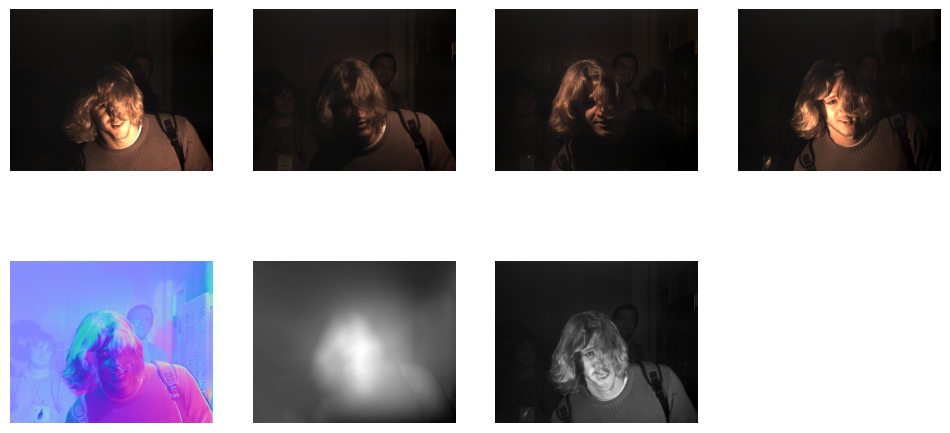

In [5]:
id_dir = '../Photometric_DB/2227/2007-12-04_12-22-06'

im0 = cv2.imread(os.path.join(id_dir, 'im0.bmp'))
im1 = cv2.imread(os.path.join(id_dir, 'im1.bmp'))
im2 = cv2.imread(os.path.join(id_dir, 'im2.bmp'))
im3 = cv2.imread(os.path.join(id_dir, 'im3.bmp'))
normal_map = cv2.imread(os.path.join(id_dir, 'normalmap.exr'), cv2.IMREAD_UNCHANGED)
albedo = cv2.imread(os.path.join(id_dir, 'albedo.exr'), cv2.IMREAD_UNCHANGED)
depth_map = cv2.imread(os.path.join(id_dir, 'depthmap.exr'), cv2.IMREAD_UNCHANGED)
plt.figure(figsize=(12,6))

plt.subplot(2,4,1)
plt.imshow(cv2.cvtColor(im0, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2,4,2)
plt.imshow(cv2.cvtColor(im1, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2,4,3)
plt.imshow(cv2.cvtColor(im2, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2,4,4)
plt.imshow(cv2.cvtColor(im3, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2,4,5)
plt.imshow(cv2.cvtColor(normal_map, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2,4,6)
plt.imshow(depth_map, cmap='gray')
plt.axis('off')

plt.subplot(2,4,7)
plt.imshow(albedo, cmap='gray')
plt.axis('off')

plt.show()

- '../Photometric_DB/2023/2008-04-24_17-10-16'

    box = [400, 0, 350,350]
- '../Photometric_DB/1205/2008-12-16_14-30-03'

    box = [550, 650, 230, 300]

- '../Photometric_DB/2060/2008-02-21_16-56-43'

    box = [420, 320, 150, 550]
- '../Photometric_DB/2227/2007-12-04_12-22-06'
    
    box = [560, 500, 150, 300]

(-0.5, 299.5, 299.5, -0.5)

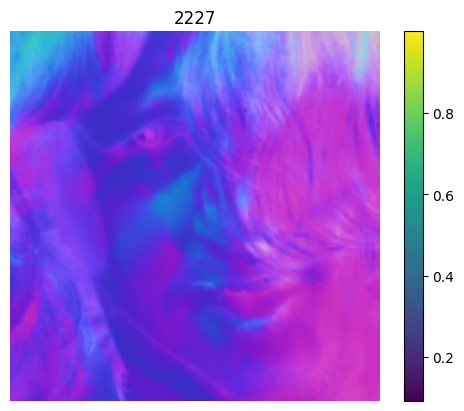

In [14]:
box = [560, 500, 150, 300]

x, y, width, height = adjust_box(box, albedo.shape)

# Cắt ảnh theo tọa độ bounding box
face_crop = normal_map[y:y + height, x:x + width]
plt.imshow(cv2.cvtColor(face_crop, cv2.COLOR_BGR2RGB))
plt.title('2227')
plt.colorbar()
plt.axis('off')

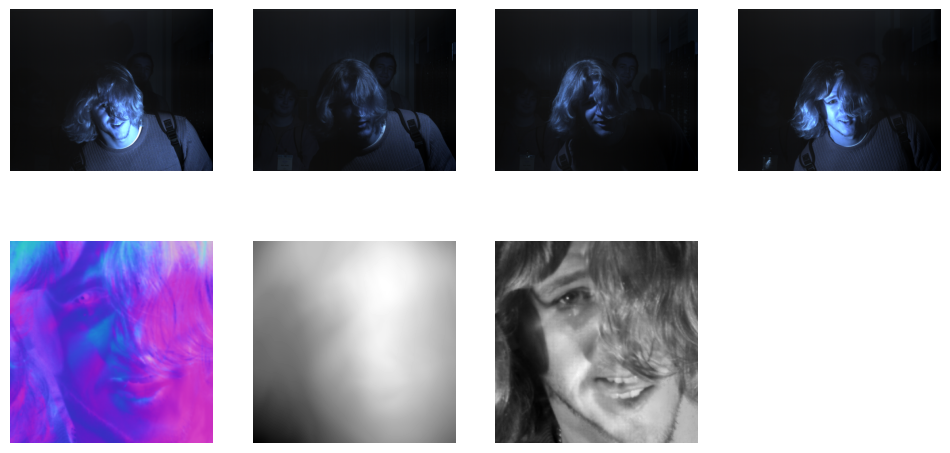

In [15]:
box = [560, 500, 150, 300]

source_session_path = '../Photometric_DB/2227/2007-12-04_12-22-06'

file_to_crop = ['normalmap.exr', 'albedo.exr', 'depthmap.exr']

for img in os.listdir(source_session_path):
    if img in file_to_crop:
        img_path = os.path.join(source_session_path, img)
        filename, ext = os.path.splitext(img)
        crop_image(cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB), adjust_box(box, albedo.shape), img_path)
        crop_image(cv2.imread(img_path, cv2.IMREAD_UNCHANGED), adjust_box(box, albedo.shape), img_path)
            
normal_map = cv2.imread(os.path.join(source_session_path, 'normalmap_mtcnn.exr'), cv2.IMREAD_UNCHANGED)
albedo = cv2.imread(os.path.join(source_session_path, 'albedo_mtcnn.exr'), cv2.IMREAD_UNCHANGED)
depth_map = cv2.imread(os.path.join(source_session_path, 'depthmap_mtcnn.exr'), cv2.IMREAD_UNCHANGED)

plt.figure(figsize=(12,6))

plt.subplot(2,4,1)
plt.imshow(im0)
plt.axis('off')

plt.subplot(2,4,2)
plt.imshow(im1)
plt.axis('off')

plt.subplot(2,4,3)
plt.imshow(im2)
plt.axis('off')

plt.subplot(2,4,4)
plt.imshow(im3)
plt.axis('off')

plt.subplot(2,4,5)
plt.imshow(cv2.cvtColor(normal_map, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2,4,6)
plt.imshow(depth_map, cmap='gray')
plt.axis('off')

plt.subplot(2,4,7)
plt.imshow(albedo, cmap='gray')
plt.axis('off')

plt.show()

## 3. Copy các file trong thư mục dataset vào 1 thư mục dataset mới

In [4]:
photometric_db = '../Photometric_DB'

dest_folder = '../3D_Dataset/Albedo'

files_to_copy = [
    'albedo_mtcnn.exr'
]
num_cpus = 14

In [5]:
# Hàm sao chép file
def copy_file(filename, session_path, new_id_folder_path, session):
    source_file = os.path.join(session_path, filename)
    _, ext = os.path.splitext(filename)
    destination_file = os.path.join(new_id_folder_path, f"{session}{ext}")
    shutil.copy(source_file, destination_file)

# Tạo thư mục đích nếu chưa tồn tại
if not os.path.exists(dest_folder):
    os.makedirs(dest_folder, exist_ok=True)

# Sử dụng ProcessPoolExecutor để sao chép file từ các session path hợp lệ
with ProcessPoolExecutor() as executor:
    futures = []
    
    for id in os.listdir(photometric_db):
        id_path = os.path.join(photometric_db, id)
        if os.path.isdir(id_path):
            new_id_folder_path = os.path.join(dest_folder, id)
            if not os.path.exists(new_id_folder_path):
                os.mkdir(new_id_folder_path)
            
            for session in os.listdir(id_path):
                source_session_path = os.path.join(id_path, session)
                futures.append(executor.submit(copy_file, files_to_copy[0], source_session_path, new_id_folder_path, session))

    # Đợi tất cả các tác vụ sao chép hoàn thành
    for future in as_completed(futures):
        future.result()

## 4. Final check face detect and face aligment

### Check Face aligment

Kiểm tra lại lần cuối tất cả các ảnh, không có gì đảm MTCNN detect sai

In [14]:
dest_folder = '../3D_Dataset/Albedo'

id = 1050

1050


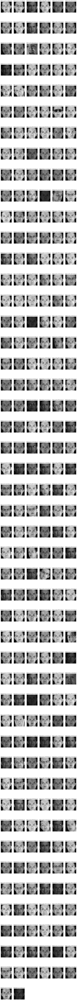

In [15]:
id_dir = os.path.join(dest_folder, str(id))
number_images = len(os.listdir(id_dir))

if number_images !=1:
    # Sử dụng math.ceil() để làm tròn số hàng
    row = math.ceil(number_images / 6)
    index = 1  # Chỉnh index bắt đầu từ 1 để tránh lỗi với plt.subplot()

    plt.figure(figsize=(18, row * 5))
    
    for image_name in os.listdir(id_dir):
        image_path = os.path.join(id_dir, image_name)
        image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
        plt.subplot(row, 6, index)
        plt.axis('off')
        plt.title(image_name)
        plt.imshow(image, cmap='gray')
        index += 1
else:
    plt.figure(figsize=(10,6))
    for image_name in os.listdir(id_dir):
        
        image_path = os.path.join(id_dir, image_name)
        image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
        
        base, _ = os.path.splitext(image_name)
        
        origin_image_path = os.path.join('../Photometric_DB', str(id), base)
        
        print(origin_image_path)
        
        origin_image = cv2.imread(os.path.join(origin_image_path, 'normalmap.exr'), cv2.IMREAD_UNCHANGED)

        plt.subplot(1,2,1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('crop')
        plt.axis('off')

        plt.subplot(1,2,2)
        plt.imshow(cv2.cvtColor(origin_image, cv2.COLOR_BGR2RGB))
        plt.title('origin')
        plt.axis('off')

print(id)
id += 1
plt.show()

(1024, 1280, 3)
(700, 700)


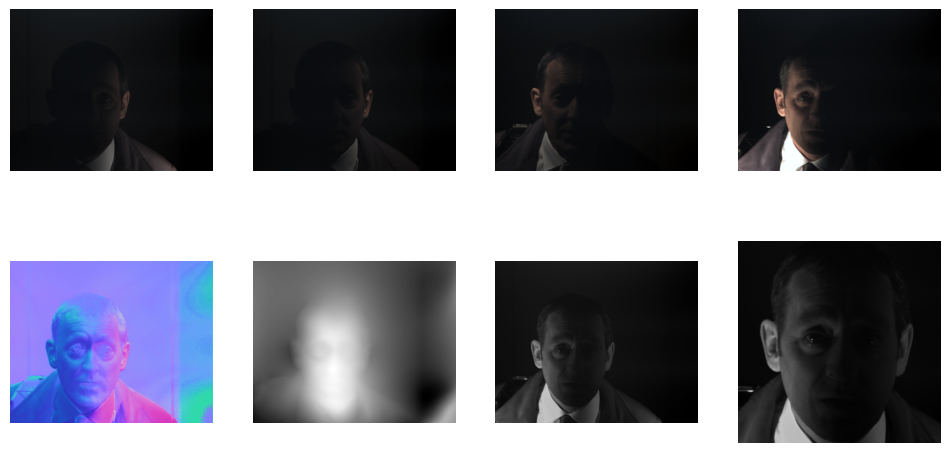

In [434]:
session = '../Photometric_DB/2060/2008-02-21_16-56-43'

im0 = cv2.cvtColor(cv2.imread(os.path.join(session, 'im0.bmp')), cv2.COLOR_BGR2RGB)
im1 = cv2.cvtColor(cv2.imread(os.path.join(session, 'im1.bmp')), cv2.COLOR_BGR2RGB)
im2 = cv2.cvtColor(cv2.imread(os.path.join(session, 'im2.bmp')), cv2.COLOR_BGR2RGB)
im3 = cv2.cvtColor(cv2.imread(os.path.join(session, 'im3.bmp')), cv2.COLOR_BGR2RGB)
normal_map = cv2.imread(os.path.join(session, 'normalmap.exr'), cv2.IMREAD_UNCHANGED)
albedo = cv2.imread(os.path.join(session, 'albedo.exr'), cv2.IMREAD_UNCHANGED)
albedo_crop = cv2.imread(os.path.join(session, 'albedo_crop.exr'), cv2.IMREAD_UNCHANGED)
depth_map = cv2.imread(os.path.join(session, 'depthmap.exr'), cv2.IMREAD_UNCHANGED)

print(im0.shape)
plt.figure(figsize=(12,6))

plt.subplot(2,4,1)
plt.imshow(im0)
plt.axis('off')

plt.subplot(2,4,2)
plt.imshow(im1)
plt.axis('off')

plt.subplot(2,4,3)
plt.imshow(im2)
plt.axis('off')

plt.subplot(2,4,4)
plt.imshow(im3)
plt.axis('off')

plt.subplot(2,4,5)
plt.imshow(cv2.cvtColor(normal_map, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2,4,6)
plt.imshow(depth_map, cmap='gray')
plt.axis('off')

plt.subplot(2,4,7)
plt.imshow(albedo, cmap='gray')
plt.axis('off')

plt.subplot(2,4,8)
plt.imshow(albedo_crop, cmap='gray')
plt.axis('off')
print(albedo_crop.shape)

plt.show()

In [ ]:
# Kiểm tra toàn bộ kích thước ảnh có về 448, 336 không => Không dùng nữa
def check_image_shape(dataset_path, target_shape=(448, 336)):
    for folder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, folder)
        
        for image_file in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, image_file)
            
            # Đọc ảnh
            image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
                
            if image is None:
                print(f"Không thể đọc ảnh: {image_path}")
                continue
            
            # Kiểm tra shape
            if image.shape[:2] != target_shape:
                print(f"Ảnh không đúng kích thước: {image_path}, shape hiện tại: {image.shape[:2]}")

# Đường dẫn đến dataset
dataset_path = "../3D_Dataset/Albedo/"
check_image_shape(dataset_path)

Sau khi xem xét kỹ lưỡng, em quyết định bỏ 1 số ảnh, chi tiết xem file *remove_file.csv*

In [523]:
import os
def remove_paths(dataset_path):
    files = set()
    with open('remove_file.csv', 'r') as f:
        files = set(f.read().splitlines())
    for file in files:
        file_path = os.path.join(dataset_path, file)
        try:
            if os.path.exists(file_path):  # Kiểm tra xem tệp có tồn tại không
                os.remove(file_path)
                print(f"Đã xóa tệp: {file_path}")
                if len(os.listdir(os.path.dirname(file_path))) == 0:
                    os.rmdir(os.path.dirname(file_path))
                    print(f"Đã xóa thư mục: {os.path.dirname(file_path)}")
            else:
                print(f"Tệp không tồn tại: {file_path}")
        except Exception as e:
            print(f"Lỗi khi xóa tệp {file_path}: {e}")
        
dataset_path = "../3D_Dataset/Albedo"
remove_paths(dataset_path)

Đã xóa tệp: ../3D_Dataset/Albedo/1030/2009-08-20_15-21-41.exr
Đã xóa tệp: ../3D_Dataset/Albedo/1050/2007-12-04_10-21-42.exr
Đã xóa tệp: ../3D_Dataset/Albedo/2021/2008-04-03_10-41-17.exr
Đã xóa tệp: ../3D_Dataset/Albedo/1050/2007-12-11_14-48-39.exr
Đã xóa tệp: ../3D_Dataset/Albedo/1025/2008-05-16_13-18-37.exr
Đã xóa tệp: ../3D_Dataset/Albedo/1025/2008-02-16_12-52-27.exr
Đã xóa tệp: ../3D_Dataset/Albedo/2180/2007-12-05_13-27-28.exr
Đã xóa tệp: ../3D_Dataset/Albedo/1045/2008-06-11_13-34-36.exr
Đã xóa tệp: ../3D_Dataset/Albedo/1087/2009-06-26_11-58-02.exr
Đã xóa thư mục: ../3D_Dataset/Albedo/1087
Đã xóa tệp: ../3D_Dataset/Albedo/1099/2008-02-18_15-38-38.exr
Đã xóa tệp: ../3D_Dataset/Albedo/1039/2008-02-21_07-43-28.exr
Đã xóa tệp: ../3D_Dataset/Albedo/2184/2007-12-04_12-18-45.exr
Đã xóa tệp: ../3D_Dataset/Albedo/1025/2008-03-05_21-31-09.exr
Đã xóa tệp: ../3D_Dataset/Albedo/2184/2007-12-04_12-17-45.exr
Đã xóa tệp: ../3D_Dataset/Albedo/1025/2008-02-15_21-13-01.exr
Đã xóa tệp: ../3D_Dataset/Al

**Kết quả: MTCNN hoạt động chính xác hầu hết các trường hợp. Tuy nhiên có 1 số trường hợp đặc biệt phát sinh như:**
- 1 ảnh duy nhất có 2 mặt người, trong đó mặt người trọng tâm có biểu cảm gây khó khăn cho MTCNN, còn mặt người thứ 2 dễ detect và MTCNN cho kết quả cao. Do đó khi crop, ảnh crop nhầm người
- Tổng quan dataset có 1 số rất ít ảnh albedo bị tái tạo lỗi 1 chút có thể chấp nhận được. Tuy nhiên có 1 số ảnh thì albedo bị lỗi hoàn toàn và phải bỏ. Session của chúng được đề cập trong thư mục *bỏ*
- 1 session duy nhất MTCNN không detect được ở phần 3, do id này nhiều ảnh nên em bỏ không crop bằng tay nữa. Path của session *../Photometric_DB/2023/2008-04-24_17-10-16*
- 1 số ảnh có biểu cảm quá dị đã được liệt kê trong thư mục *bỏ*
- 1 số ít ảnh chụp nghiêng trái, phải dẫn đến mất 1 nửa khuôn mặt. Đã được liệt kê trong thư mục *bỏ*
- 1 số ít ảnh quá tối. Đã được liệt kê trong thư mục *bỏ*
- 1 số ít ảnh shape bị lỗi và có thể cải thiện bằng tay. Đã được liệt kê trong thư mục *bỏ*

### Check imbalance dataset

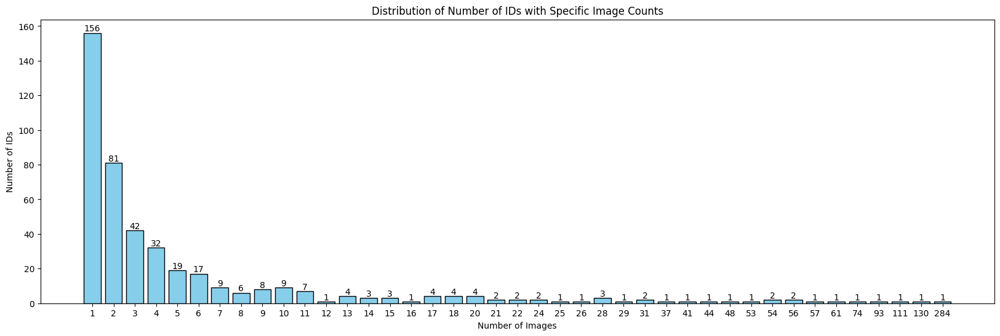

In [524]:
dataset_path = '../3D_Dataset/Albedo'

# Đếm số lượng ảnh cho mỗi ID
id_counts = {}
for id_dir in os.listdir(dataset_path):
    id_path = os.path.join(dataset_path, id_dir)
    if os.path.isdir(id_path):
        num_images = len(os.listdir(id_path))
        id_counts[id_dir] = num_images

# Xếp lại các id.
sorted_keys = sorted(id_counts.keys())

sorted_values = [id_counts[key] for key in sorted_keys]

# Đếm số lượng ID có cùng số lượng ảnh
count_values = Counter(sorted_values)

# Lấy các giá trị duy nhất của số lượng ảnh và số lượng ID tương ứng
unique_values = sorted(count_values.keys())
frequency = [count_values[val] for val in unique_values]

# Chuyển các giá trị trong unique_values thành chuỗi
unique_values_str = list(map(str, unique_values))

# Tính chiều rộng cho mỗi cột
num_row = len(unique_values)  # Số lượng cột
max_value = max(frequency)  # Giá trị lớn nhất trong frequency
width = 0.8  # Chiều rộng cột (giảm xuống để tạo khoảng cách)

# Vẽ biểu đồ cột với chiều rộng tính toán
fig, ax = plt.subplots(figsize=(20, 6))

# Tạo khoảng cách giữa các cột bằng cách tăng khoảng cách giữa chúng (sử dụng range)
bars = ax.bar(unique_values_str, frequency, color='skyblue', edgecolor='black', width=width)

# Thêm số lượng trên mỗi cột
for x, y in zip(unique_values_str, frequency):
    ax.text(x, y, str(y), ha='center', va='bottom', fontsize=10)

# Thêm tiêu đề và nhãn
ax.set_xlabel('Number of Images')
ax.set_ylabel('Number of IDs')
ax.set_title('Distribution of Number of IDs with Specific Image Counts')

# Thiết lập tính năng hiển thị thông tin khi di chuột vào các cột
mplcursors.cursor(bars, hover=True).connect(
    'add', lambda sel: sel.annotation.set_text(f'Number of Images: {sel.target[1]}\nID: {sel.target[0]}')
)

# Hiển thị biểu đồ
plt.show()

In [2]:
import os
import random
import cv2
from concurrent.futures import ProcessPoolExecutor

os.environ["OPENCV_IO_ENABLE_OPENEXR"] = "1"

# Set seed for reproducibility
SEED = 42
random.seed(SEED)

albedo_folder = '../3D_Dataset/Albedo'
depthmap_folder = '../3D_Dataset/Depth_Map'
normalmap_folder = '../3D_Dataset/Normal_Map'

new_albedo_folder = '../Dataset/Albedo'
new_depthmap_folder = '../Dataset/Depth_Map'
new_normalmap_folder = '../Dataset/Normal_Map'

os.makedirs(new_albedo_folder, exist_ok=True)
os.makedirs(new_depthmap_folder, exist_ok=True)
os.makedirs(new_normalmap_folder, exist_ok=True)

num_cpus = 13

# Helper function to seed in subprocesses
def set_seed(seed):
    random.seed(seed)

# Resize and save image
def process_image(src_path, dst_path, target_size=256):
    image = cv2.imread(src_path, cv2.IMREAD_UNCHANGED)

    # interpolation = cv2.INTER_LINEAR
    # if 'depth_map' in src_path.lower() or 'normal_map' in src_path.lower():
    #     interpolation = cv2.INTER_NEAREST

    # resized_image = cv2.resize(image, (target_size, target_size), interpolation=interpolation)
    cv2.imwrite(dst_path, image)

# Bỏ tất cả id có 1 ảnh đi, id có 2,3 ảnh ném vào testset => 125 id trong teset set
# Tất cả 162 id còn lại ném vào train set, mỗi id có không quá 6 ảnh
def check(id):
    all_filenames = os.listdir(os.path.join(albedo_folder, id))
    total = len(all_filenames)
    if total >= 2:
        if total < 4:
            return None, all_filenames
        else:
            return all_filenames, None
    return None, None

# Copy images to the new directory
def copy_to_new_dir(train_filenames, test_filenames, id):
    
    if train_filenames is not None:
        os.makedirs(os.path.join(new_albedo_folder, 'train', id), exist_ok=True)
        os.makedirs(os.path.join(new_depthmap_folder, 'train', id), exist_ok=True)
        os.makedirs(os.path.join(new_normalmap_folder, 'train', id), exist_ok=True)

        for filename in train_filenames:
            src = os.path.join(albedo_folder, id, filename)
            dist = os.path.join(new_albedo_folder, 'train', id, filename)
            process_image(src, dist)

            src = os.path.join(depthmap_folder, id, filename)
            dist = os.path.join(new_depthmap_folder, 'train', id, filename)
            process_image(src, dist)

            src = os.path.join(normalmap_folder, id, filename)
            dist = os.path.join(new_normalmap_folder, 'train', id, filename)
            process_image(src, dist)

    if test_filenames is not None:
        os.makedirs(os.path.join(new_albedo_folder, 'test', id), exist_ok=True)
        os.makedirs(os.path.join(new_depthmap_folder, 'test', id), exist_ok=True)
        os.makedirs(os.path.join(new_normalmap_folder, 'test', id), exist_ok=True)

        for filename in test_filenames:
            src = os.path.join(albedo_folder, id, filename)
            dist = os.path.join(new_albedo_folder, 'test', id, filename)
            process_image(src, dist)

            src = os.path.join(depthmap_folder, id, filename)
            dist = os.path.join(new_depthmap_folder, 'test', id, filename)
            process_image(src, dist)

            src = os.path.join(normalmap_folder, id, filename)
            dist = os.path.join(new_normalmap_folder, 'test', id, filename)
            process_image(src, dist)

# Parallel processing with consistent seeding
with ProcessPoolExecutor(max_workers=num_cpus) as executor:
    for id in os.listdir(albedo_folder):
        train_filenames, test_filenames = check(id)
        executor.submit(copy_to_new_dir, train_filenames, test_filenames, id)

Tạo gallery

In [3]:
import os
import cv2
from concurrent.futures import ProcessPoolExecutor

os.environ["OPENCV_IO_ENABLE_OPENEXR"] = "1"

gallery_dir = '../Gallery'

gallery_albedo_dir = os.path.join(gallery_dir, 'Albedo', 'test')
gallery_normalmap_dir = os.path.join(gallery_dir, 'Normal_Map', 'test')
gallery_depthmap_dir = os.path.join(gallery_dir, 'Depth_Map', 'test')

os.makedirs(gallery_dir, exist_ok=True)
os.makedirs(gallery_albedo_dir, exist_ok=True)
os.makedirs(gallery_normalmap_dir, exist_ok=True)
os.makedirs(gallery_depthmap_dir, exist_ok=True)

albedo_folder = '../3D_Dataset/Albedo'
depthmap_folder = '../3D_Dataset/Depth_Map'
normalmap_folder = '../3D_Dataset/Normal_Map'

# Hàm resize ảnh
def process_image(src_path, dst_path, target_size=256):
    # Đọc ảnh từ file nguồn
    image = cv2.imread(src_path, cv2.IMREAD_UNCHANGED)
    if image is None:
        print(f"Lỗi: Không thể đọc ảnh {src_path}")
        return
    
    # Resize ảnh về kích thước target_size x target_size
    # resized_image = cv2.resize(image, (target_size, target_size), interpolation=cv2.INTER_AREA)
    
    # Ghi ảnh đã resize vào file đích
    cv2.imwrite(dst_path, image)

def copy_to_new_dir(id):
    gallery_albedo_id_dir = os.path.join(gallery_albedo_dir, id)
    gallery_normalmap_id_dir = os.path.join(gallery_normalmap_dir, id)
    gallery_depthmap_id_dir = os.path.join(gallery_depthmap_dir, id)
    
    # Tạo thư mục đích nếu chưa tồn tại
    os.makedirs(gallery_albedo_id_dir, exist_ok=True)
    os.makedirs(gallery_normalmap_id_dir, exist_ok=True)
    os.makedirs(gallery_depthmap_id_dir, exist_ok=True)
    
    # Copy và resize ảnh từ từng thư mục con
    for filename in os.listdir(os.path.join(albedo_folder, id)):
        src_albedo = os.path.join(albedo_folder, id, filename)
        dst_albedo = os.path.join(gallery_albedo_id_dir, filename)
        process_image(src_albedo, dst_albedo)  # Resize ảnh trước khi lưu
        
        src_normalmap = os.path.join(normalmap_folder, id, filename)
        dst_normalmap = os.path.join(gallery_normalmap_id_dir, filename)
        process_image(src_normalmap, dst_normalmap)  # Resize ảnh
        
        src_depthmap = os.path.join(depthmap_folder, id, filename)
        dst_depthmap = os.path.join(gallery_depthmap_id_dir, filename)
        process_image(src_depthmap, dst_depthmap)  # Resize ảnh
        
with ProcessPoolExecutor() as executor:
    for id in os.listdir(albedo_folder):
        id_path = os.path.join(albedo_folder, id)
        if len(os.listdir(id_path)) == 1 or id == '1219':
            executor.submit(copy_to_new_dir, id)

In [3]:
import os
import csv

# Đường dẫn tới thư mục chứa dữ liệu
data_dir = '../Dataset/Albedo/test'

# Tạo và mở file CSV để lưu kết quả
with open('test_id.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    
    # Ghi tiêu đề cột vào file CSV
    writer.writerow(['id', 'filename'])
    
    # Duyệt qua tất cả các thư mục trong data_dir
    for id in os.listdir(data_dir):
        id_path = os.path.join(data_dir, id)
        
        # Kiểm tra nếu id_path là thư mục (tránh trường hợp là file)
        if os.path.isdir(id_path):
            for filename in os.listdir(id_path):
                # Bỏ phần mở rộng .exr trong filename
                if filename.endswith('.exr'):
                    filename_no_ext = filename[:-4]  # Bỏ phần mở rộng .exr
                    # Ghi dữ liệu vào file CSV
                    writer.writerow([id, filename_no_ext])

print("File CSV đã được tạo thành công.")

File CSV đã được tạo thành công.


# Multi task learning

## Understand dataset and tasks

In [175]:
metadata_path = '../Photometric_DB/metadata_all.txt'
output_path = './multi/metadata.csv'

# id: Nhận diện danh tính (số id bằng số session)
# gender: Giới tính
# spectacles: Kính
# facial_hair: Râu
# pose: Tư thế
# quality: Chất lượng
# Occlusion: Mờ
# Emotion: Cảm xúc
header = [
    'id', 'session', 'Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Quality', 'Occlusion', 'Emotion'
]

processed_data = []

# 31 trường: Lấy col 1-2, 25-31 bỏ 32
with open(metadata_path, 'r') as f:
    lines = f.readlines()
    
    for line in lines:
        fields = line.strip().split(", ")
        
        # Làm sạch cột Emotion nếu có dấu ngoặc kép thừa hoặc dấu phẩy thừa
        if str(fields[30]).startswith('"') and str(fields[30]).endswith('"'):
            fields[30] = fields[30][1:-1]  # Loại bỏ dấu ngoặc kép thừa
        
        # Làm sạch dấu phẩy thừa trong Emotion
        if fields[30].endswith(','):
            fields[30] = fields[30][:-1]  # Loại bỏ dấu phẩy cuối chuỗi
        
        # Loại bỏ các thông tin về landmark (cột từ index 2 đến 21) và "other"
        filtered_fields = fields[:2] + fields[24:31]
        
        # Thêm vào processed_data
        processed_data.append(filtered_fields)

# Ghi dữ liệu đã làm sạch vào file CSV mới
with open(output_path, 'w', newline='') as csvfile:
    csv_writer = csv.writer(csvfile)
    # Ghi header và dữ liệu vào file CSV
    csv_writer.writerow(header)
    csv_writer.writerows(processed_data)

print("File đã được làm sạch và ghi lại vào:", output_path)


File đã được làm sạch và ghi lại vào: ./multi/metadata.csv


In [27]:
# Đọc file CSV và đếm số lượng các loại giá trị duy nhất cho các cột trừ 'id' và 'session'
def count_unique_values(csv_path, headers_to_exclude):
    unique_values_by_column = {header: set() for header in headers_to_exclude}

    with open(csv_path, 'r') as csvfile:
        csv_reader = csv.reader(csvfile)
        headers = next(csv_reader)  # Đọc header
        
        # Lấy chỉ số của các header cần đếm
        for row in csv_reader:
            for header, value in zip(headers, row):
                if header in headers_to_exclude:
                    unique_values_by_column[header].add(value)  # Thêm giá trị duy nhất vào set

    return unique_values_by_column

# Hiển thị số lượng các loại (unique values) có trong từng cột
def display_unique_values(unique_values_by_column):
    for column, unique_values in unique_values_by_column.items():
        print(f"Unique values in {column}: {sorted(unique_values)}")
        print(f"Total number of unique values in {column}: {len(unique_values)}\n")

# Đường dẫn tới file CSV
csv_path = './multi/metadata.csv'

# Các header cần xử lý (trừ 'id' và 'session')
headers_to_exclude = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Quality', 'Occlusion', 'Emotion']

# Đếm các loại giá trị duy nhất trong từng cột
unique_values_by_column = count_unique_values(csv_path, headers_to_exclude)

# Hiển thị các loại và số lượng có trong từng cột
display_unique_values(unique_values_by_column)

Unique values in Gender: ['female', 'male']
Total number of unique values in Gender: 2

Unique values in Spectacles: ['no', 'yes']
Total number of unique values in Spectacles: 2

Unique values in Facial_Hair: ['beard', 'both', 'moustache', 'none', 'stubble']
Total number of unique values in Facial_Hair: 5

Unique values in Pose: ['1', '2', '3', '4', '5']
Total number of unique values in Pose: 5

Unique values in Quality: ['blur', 'dark', 'ok']
Total number of unique values in Quality: 3

Unique values in Occlusion: ['', '-hair', '-hand', '-hand-other', '-mobile', '-other']
Total number of unique values in Occlusion: 6

Unique values in Emotion: ['blankstare', 'emoOther', 'negative', 'positive']
Total number of unique values in Emotion: 4



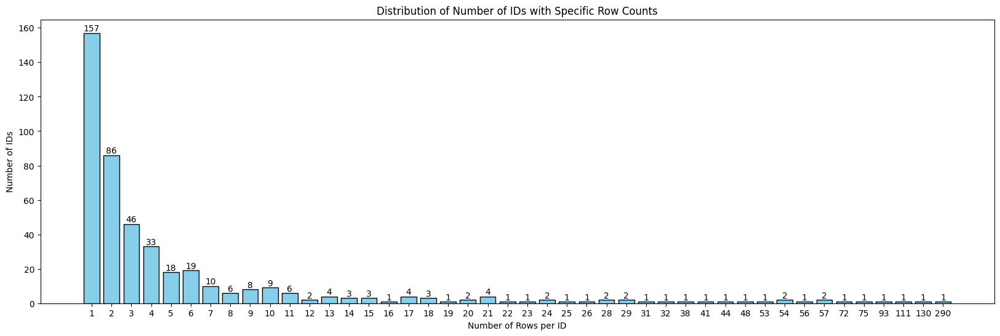

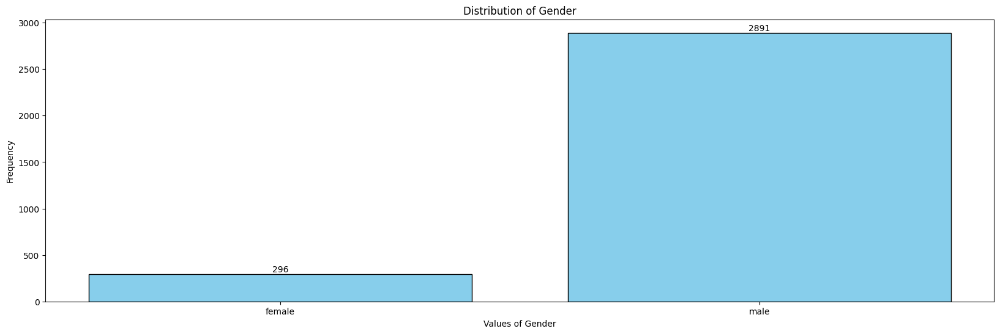

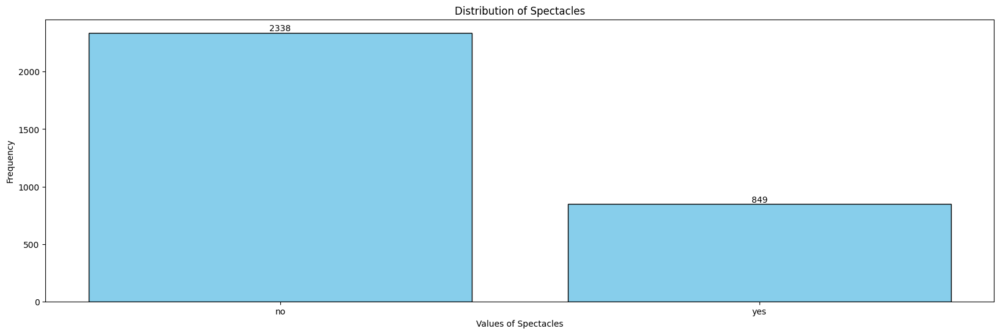

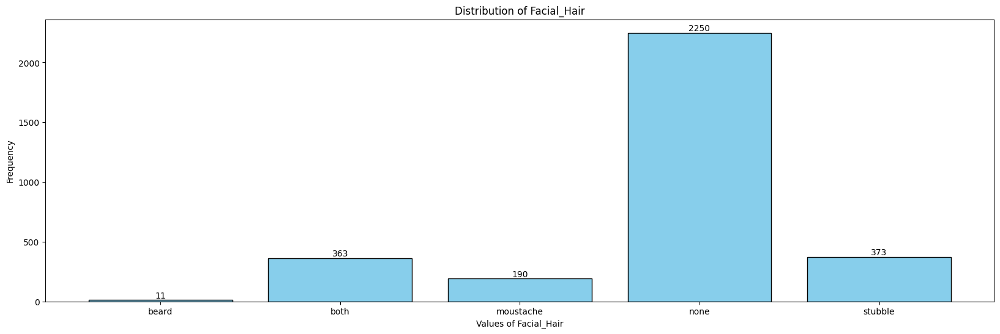

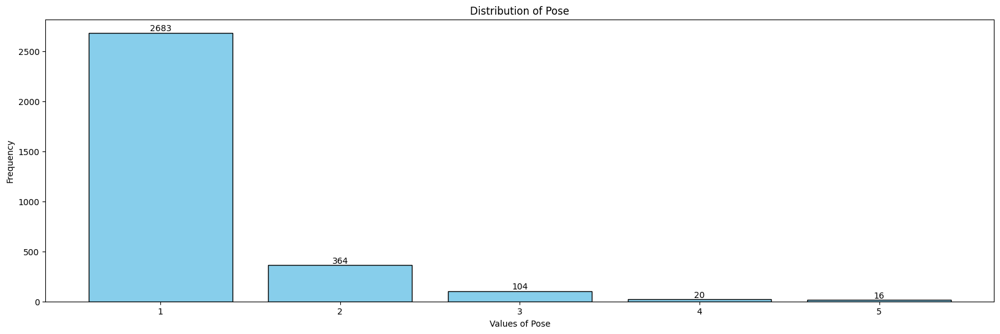

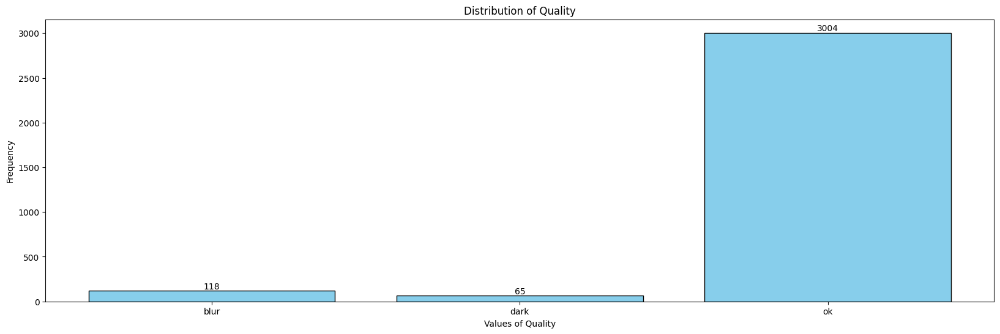

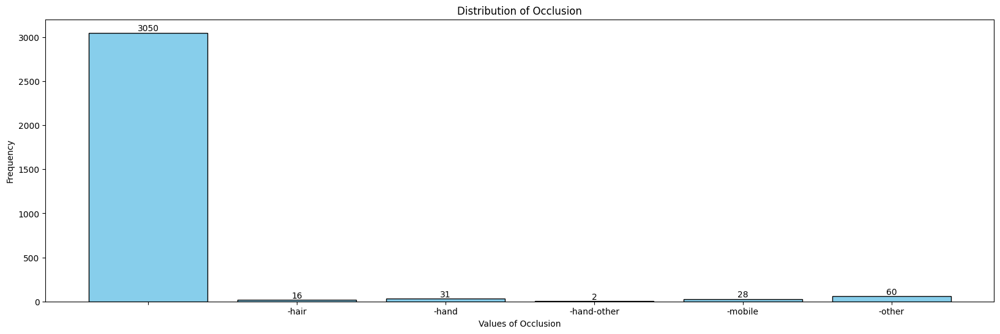

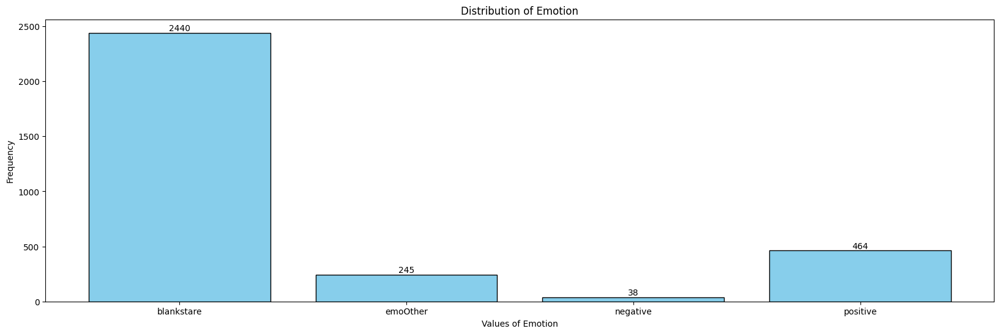

In [45]:
# Đọc file CSV và đếm số lượng row cho mỗi ID và đếm giá trị duy nhất cho từng cột (trừ 'session')
def count_data_from_csv(csv_path, headers_to_exclude):
    id_count = Counter()  # Đếm số lượng row cho mỗi id
    column_counts = {header: Counter() for header in headers_to_exclude}  # Đếm số lượng giá trị cho mỗi cột
    
    with open(csv_path, 'r') as csvfile:
        csv_reader = csv.reader(csvfile)
        headers = next(csv_reader)  # Đọc header
        
        # Đọc từng dòng và đếm
        for row in csv_reader:
            id_count[row[0]] += 1  # row[0] là ID
            
            # Đếm giá trị cho các cột cần xử lý
            for header, value in zip(headers, row):
                if header in headers_to_exclude:
                    column_counts[header][value] += 1

    return id_count, column_counts

# Vẽ biểu đồ phân bố số lượng row cho mỗi ID
def plot_row_distribution(id_count):
    row_distribution = Counter(id_count.values())

    unique_values = sorted(row_distribution.keys())
    frequency = [row_distribution[val] for val in unique_values]

    unique_values_str = list(map(str, unique_values))

    width = 0.8  # Chiều rộng cột
    fig, ax = plt.subplots(figsize=(20, 6))

    bars = ax.bar(unique_values_str, frequency, color='skyblue', edgecolor='black', width=width)

    for x, y in zip(unique_values_str, frequency):
        ax.text(x, y, str(y), ha='center', va='bottom', fontsize=10)

    ax.set_xlabel('Number of Rows per ID')
    ax.set_ylabel('Number of IDs')
    ax.set_title('Distribution of Number of IDs with Specific Row Counts')

    plt.show()

# Vẽ biểu đồ phân bố giá trị cho từng cột
def plot_column_distribution(column_counts):
    for column, count_data in column_counts.items():
        unique_values = sorted(count_data.keys())
        frequency = [count_data[val] for val in unique_values]

        unique_values_str = list(map(str, unique_values))

        width = 0.8  # Chiều rộng cột
        _, ax = plt.subplots(figsize=(20, 6))

        bars = ax.bar(unique_values_str, frequency, color='skyblue', edgecolor='black', width=width)

        for x, y in zip(unique_values_str, frequency):
            ax.text(x, y, str(y), ha='center', va='bottom', fontsize=10)

        ax.set_xlabel(f'Values of {column}')
        ax.set_ylabel('Frequency')
        ax.set_title(f'Distribution of {column}')

        plt.show()

# Đường dẫn tới file CSV
csv_path = './multi/metadata.csv'

# Các header cần xử lý (trừ 'session')
headers_to_exclude = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Quality', 'Occlusion', 'Emotion']

# Đếm số lượng row cho mỗi ID và số lượng giá trị cho các cột
id_count, column_counts = count_data_from_csv(csv_path, headers_to_exclude)

# Vẽ biểu đồ phân phối số lượng row cho mỗi ID
plot_row_distribution(id_count)

# Vẽ biểu đồ phân phối giá trị cho các cột
plot_column_distribution(column_counts)

## Tinh chỉnh dataset

### Chuẩn bị

In [176]:
# Đường dẫn tới file metadata.csv và file final_dataset.csv
input_file = './multi/metadata.csv'
output_file = './multi/final_dataset.csv'
pre_path = '../3D_Dataset/Albedo/'

# Sao chép nội dung từ file metadata.csv sang final_dataset.csv
shutil.copy(input_file, output_file)

'./multi/final_dataset.csv'

In [177]:
# Đọc file CSV và đếm số lượng các loại giá trị duy nhất cho các cột trừ 'id' và 'session'
def count_unique_values(csv_path, headers_to_exclude):
    unique_values_by_column = {header: set() for header in headers_to_exclude}

    with open(csv_path, 'r') as csvfile:
        csv_reader = csv.reader(csvfile)
        headers = next(csv_reader)  # Đọc header
        
        # Lấy chỉ số của các header cần đếm
        for row in csv_reader:
            for header, value in zip(headers, row):
                if header in headers_to_exclude:
                    unique_values_by_column[header].add(value)  # Thêm giá trị duy nhất vào set

    return unique_values_by_column

# Hiển thị số lượng các loại (unique values) có trong từng cột
def display_unique_values(unique_values_by_column):
    for column, unique_values in unique_values_by_column.items():
        print(f"Unique values in {column}: {sorted(unique_values)}")
        print(f"Total number of unique values in {column}: {len(unique_values)}\n")

# Đọc file CSV và đếm số lượng row cho mỗi ID và đếm giá trị duy nhất cho từng cột (trừ 'session')
def count_data_from_csv(csv_path, headers_to_exclude):
    id_count = Counter()  # Đếm số lượng row cho mỗi id
    column_counts = {header: Counter() for header in headers_to_exclude}  # Đếm số lượng giá trị cho mỗi cột
    
    with open(csv_path, 'r') as csvfile:
        csv_reader = csv.reader(csvfile)
        headers = next(csv_reader)  # Đọc header
        
        # Đọc từng dòng và đếm
        for row in csv_reader:
            id_count[row[0]] += 1  # row[0] là ID
            
            # Đếm giá trị cho các cột cần xử lý
            for header, value in zip(headers, row):
                if header in headers_to_exclude:
                    column_counts[header][value] += 1

    return id_count, column_counts

# Vẽ biểu đồ phân bố số lượng row cho mỗi ID
def plot_row_distribution(id_count):
    row_distribution = Counter(id_count.values())

    unique_values = sorted(row_distribution.keys())
    frequency = [row_distribution[val] for val in unique_values]

    unique_values_str = list(map(str, unique_values))

    width = 0.8  # Chiều rộng cột
    fig, ax = plt.subplots(figsize=(20, 6))

    bars = ax.bar(unique_values_str, frequency, color='skyblue', edgecolor='black', width=width)

    for x, y in zip(unique_values_str, frequency):
        ax.text(x, y, str(y), ha='center', va='bottom', fontsize=10)

    ax.set_xlabel('Number of Rows per ID')
    ax.set_ylabel('Number of IDs')
    ax.set_title('Distribution of Number of IDs with Specific Row Counts')

    plt.show()

# Vẽ biểu đồ phân bố giá trị cho từng cột
def plot_column_distribution(column_counts):
    for column, count_data in column_counts.items():
        unique_values = sorted(count_data.keys())
        frequency = [count_data[val] for val in unique_values]

        unique_values_str = list(map(str, unique_values))

        width = 0.8  # Chiều rộng cột
        _, ax = plt.subplots(figsize=(20, 6))

        bars = ax.bar(unique_values_str, frequency, color='skyblue', edgecolor='black', width=width)

        for x, y in zip(unique_values_str, frequency):
            ax.text(x, y, str(y), ha='center', va='bottom', fontsize=10)

        ax.set_xlabel(f'Values of {column}')
        ax.set_ylabel('Frequency')
        ax.set_title(f'Distribution of {column}')

        plt.show()

# Hàm tổng hợp để thực hiện tất cả các bước
def analyze_and_plot(csv_path, headers_to_exclude):
    # Đếm các loại giá trị duy nhất trong từng cột
    unique_values_by_column = count_unique_values(csv_path, headers_to_exclude)

    # Hiển thị các loại và số lượng có trong từng cột
    display_unique_values(unique_values_by_column)

    # Đếm số lượng row cho mỗi ID và số lượng giá trị cho các cột
    id_count, column_counts = count_data_from_csv(csv_path, headers_to_exclude)

    # Vẽ biểu đồ phân phối số lượng row cho mỗi ID
    plot_row_distribution(id_count)

    # Vẽ biểu đồ phân phối giá trị cho các cột
    plot_column_distribution(column_counts)

### Xem xét các file chất lượng xấu đã lọc

In [178]:
# Có thể không bỏ các file trong remove.txt nữa vì giờ multi task rồi. Nhưng vẫn phải bỏ các file photometric lỗi
# Đường dẫn đến file chứa dữ liệu
bad_quality = './single/remove_file.csv'

In [179]:
# remove_paths = []
# with open(bad_quality, 'r') as f:
#     for line in f:
#         # Xử lý mỗi dòng
#         line = line.strip()  # Xóa bỏ các ký tự thừa (như ký tự mới dòng)
#         image_path = pre_path + line
#         remove_paths.append((line, image_path))

# number_images = len(remove_paths)
    
# # Sử dụng math.ceil() để làm tròn số hàng
# column = 4
# row = math.ceil(number_images / column)
# index = 1  # Chỉnh index bắt đầu từ 1 để tránh lỗi với plt.subplot()

# plt.figure(figsize=(column * 5, row * 5))
    
# for line, path in remove_paths:
#     image = cv2.imread(path, cv2.IMREAD_UNCHANGED)
#     plt.subplot(row, column, index)
#     plt.axis('off')
#     plt.title(line)
#     plt.imshow(image, cmap='gray')
#     index += 1

Kết luận bỏ hết, mấy tường này khó nhận diện và chiếm thiểu số :))

In [180]:
df = pd.read_csv(output_file)

remove_rows = []

# Đọc các dòng cần loại bỏ từ một file (nếu có)
with open(bad_quality, 'r') as f:
    for line in f:
        id, imagename = line.strip().split('/')
        session, _ = imagename.split('.')
        remove_rows.append((int(id), session))
        
# Lọc dữ liệu: loại bỏ các dòng có id và session trong remove_rows
remove_df = pd.DataFrame(remove_rows, columns=['id', 'session'])

df_filtered = df[~df.set_index(['id', 'session']).index.isin(remove_df.set_index(['id', 'session']).index)]

df_filtered.to_csv(output_file, index=False)

In [181]:
# # Các header cần xử lý (trừ 'session')
# headers_to_exclude = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Quality', 'Occlusion', 'Emotion']

# # Phân tích và vẽ biểu đồ
# analyze_and_plot(output_file, headers_to_exclude)

### Loại bỏ bớt task

1. Gender: ['female', 'male']

2. Spectacles(Kính): ['no', 'yes']

3. Facial_Hair(râu): ['beard'(cả hai), 'both'(cả hai), 'moustache'(ria mép), 'none'(Không có), 'stubble'(râu ria)]

4. Pose: ['1', '2', '3', '4', '5']

5. Quality(Chất lượng): ['blur' (mờ), 'dark' (tối), 'ok'(tốt)]

6. Occlusion (che phủ): ['', '-hair', '-hand', '-hand-other', '-mobile', '-other']

7. Emotion(cảm xúc): ['blankstare' (nhìn chằm chằm), 'emoOther' (), 'negative' (tiêu cực), 'positive' (tích cực)]

In [182]:
# Đọc dữ liệu từ file CSV
df = pd.read_csv(output_file)

filtered_df = df[df['Quality'] == 'dark']

# filtered_df.head(10)

1. Với quality: bỏ ảnh 'blur' và 'dark' đi, chỉ giữ 'ok' => Không cần xét task quaility (nên giữ lại ko, vì đằng nào cũng thêm noise ?)

In [183]:
# # Sử dụng math.ceil() để làm tròn số hàng
# column = 4
# row = math.ceil(10 / column)
# index = 1  # Chỉnh index bắt đầu từ 1 để tránh lỗi với plt.subplot()

# plt.figure(figsize=(column * 5, row * 5))
    
# for record in filtered_df.head(10).itertuples(index=False):
#     id = record.id
#     session = record.session
#     image_path = os.path.join(pre_path, str(id), session + '.exr')
#     image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
#     plt.subplot(row, column, index)
#     plt.axis('off')
#     plt.title(line)
#     plt.imshow(image, cmap='gray')
#     index += 1

In [184]:
# Lọc DataFrame để chỉ giữ lại các dòng có 'Quality' = 'ok'
filtered_df = df[df['Quality'] == 'ok']

# Xóa cột 'Quality'
filtered_df = filtered_df.drop(columns=['Quality'])

filtered_df.to_csv(output_file, index=False)

In [185]:
# Các header cần xử lý (trừ 'session')
headers_to_exclude = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Occlusion', 'Emotion']

# Phân tích và vẽ biểu đồ
# analyze_and_plot(output_file, headers_to_exclude)

2. Xem xét về pose

In [186]:
# Đọc dữ liệu từ file CSV
df = pd.read_csv(output_file)

filtered_df = df[df['Pose'] == 2]

number_images = 20
# filtered_df.head(number_images)

In [187]:
# # Sử dụng math.ceil() để làm tròn số hàng
# column = 4
# row = math.ceil(number_images / column)
# index = 1  # Chỉnh index bắt đầu từ 1 để tránh lỗi với plt.subplot()

# plt.figure(figsize=(column * 5, row * 5))
    
# for record in filtered_df.head(number_images).itertuples(index=False):
#     id = record.id
#     session = record.session
#     image_path = os.path.join(pre_path, str(id), session + '.exr')
#     image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
#     plt.subplot(row, column, index)
#     plt.axis('off')
#     plt.title(str(id) + '/' + session)
#     plt.imshow(image, cmap='gray')
#     index += 1

Kết luận: Bỏ pose 5 và 4 đi, gộp pose 0 và 1 lại thành 1, pose 2 chuyển thành 1

In [188]:
filtered_df = df[~df['Pose'].isin([4, 5])]
filtered_df['Pose'].value_counts()

Pose
1    2520
2     333
3      81
Name: count, dtype: int64

In [189]:
filtered_df.loc[filtered_df['Pose'] == 2, 'Pose'] = 1
filtered_df['Pose'].value_counts()

Pose
1    2853
3      81
Name: count, dtype: int64

In [190]:
filtered_df.loc[filtered_df['Pose'] == 3, 'Pose'] = 2
filtered_df['Pose'].value_counts()

Pose
1    2853
2      81
Name: count, dtype: int64

In [191]:
filtered_df.to_csv(output_file, index=False)
# headers_to_exclude = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Occlusion', 'Emotion']
# analyze_and_plot(output_file, headers_to_exclude)

3. Xem xét các trường về emotion

Negative thực sự gán nhãn không ổn, tiến hành chia nó vào các lớp khác để giảm tác vụ emotion

In [192]:
# Đọc dữ liệu từ file CSV
df = pd.read_csv(output_file)

negativate_to_other = [
    (1008, '2008-05-22_17-14-26'),
    (1011, '2009-07-16_08-24-10'),
    (1011, '2009-08-13_18-39-22'),
    (1014, '2008-02-25_16-57-21'),
    (1014, '2008-02-28_16-08-11'),
    (1014, '2008-03-03_11-20-42'),
    (1014, '2008-03-14_17-11-04'),
    (1023, '2008-04-22_10-47-28'),
    (1037, '2008-03-05_16-35-18'),
    (1047, '2008-06-19_17-48-29'),
    (1050, '2007-12-04_10-02-47'),
    (1050, '2007-12-04_13-17-36'),
    (1050, '2007-12-04_13-36-20'),
    (1050, '2007-12-06_11-49-53'),
    (1050, '2008-02-28_14-58-01'),
    (1050, '2009-09-04_15-20-04'),
    (1075, '2008-04-10_13-16-20'),
    (1091, '2008-04-17_13-00-29'),
    (1116, '2008-03-13_13-41-39'),
    (1134, '2008-02-18_14-37-09'),
    (1134, '2008-02-28_17-27-59'),
    (1140, '2009-07-23_14-08-36'),
    (1154, '2009-07-15_11-28-45'),
    (1188, '2007-12-04_17-51-45'),
    (1209, '2010-02-05_17-33-53'),
    (2026, '2008-02-18_17-52-27'),
    (2026, '2008-05-09_11-53-46'),
    (2026, '2008-06-01_11-43-35'),
    (2026, '2008-06-01_11-44-11'),
    (2187, '2007-12-07_11-10-40'),
    (2199, '2007-12-04_12-12-13'),
]

negativate_to_positive = [
    (1025, '2008-02-29_20-50-50'),
    
]
negativate_to_remove = [
    (1025, '2008-03-01_09-23-22'),
    (1147, '2009-07-29_12-27-21'),
    (1050, '2007-12-05_09-18-28')
]

# Chuyển đổi danh sách thành DataFrame để dễ thao tác
to_remove = pd.DataFrame(negativate_to_remove, columns=['id', 'session'])
to_positive = pd.DataFrame(negativate_to_positive, columns=['id', 'session'])
to_other = pd.DataFrame(negativate_to_other, columns=['id', 'session'])

df = df[~((df['id'].isin(to_remove['id'])) & (df['session'].isin(to_remove['session'])))]

df.loc[(df['id'].isin(to_positive['id'])) & (df['session'].isin(to_positive['session'])), 'Emotion'] = 'positive'

df.loc[(df['id'].isin(to_other['id'])) & (df['session'].isin(to_other['session'])), 'Emotion'] = 'emoOther'

In [193]:
# # Sử dụng math.ceil() để làm tròn số hàng
# column = 4
# row = math.ceil(number_images / column)
# index = 1  # Chỉnh index bắt đầu từ 1 để tránh lỗi với plt.subplot()

# plt.figure(figsize=(column * 5, row * 5))
    
# for record in filtered_df.head(number_images).itertuples(index=False):
#     id = record.id
#     session = record.session
#     image_path = os.path.join(pre_path, str(id), session + '.exr')
#     image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
#     plt.subplot(row, column, index)
#     plt.axis('off')
#     plt.title(str(id) + '/' + session)
#     plt.imshow(image, cmap='gray')
#     index += 1

In [194]:
filtered_df = df
filtered_df['Emotion'].value_counts()

Emotion
blankstare    2253
positive       424
emoOther       254
Name: count, dtype: int64

In [195]:
filtered_df.loc[filtered_df['Emotion'] == 'positive', 'Emotion'] = 'emoOther'
filtered_df['Emotion'].value_counts()

Emotion
blankstare    2253
emoOther       678
Name: count, dtype: int64

Unique values in Gender: ['female', 'male']
Total number of unique values in Gender: 2

Unique values in Spectacles: ['no', 'yes']
Total number of unique values in Spectacles: 2

Unique values in Facial_Hair: ['beard', 'both', 'moustache', 'none', 'stubble']
Total number of unique values in Facial_Hair: 5

Unique values in Pose: ['1', '2']
Total number of unique values in Pose: 2

Unique values in Occlusion: ['', '-hair', '-hand', '-hand-other', '-mobile', '-other']
Total number of unique values in Occlusion: 6

Unique values in Emotion: ['blankstare', 'emoOther']
Total number of unique values in Emotion: 2



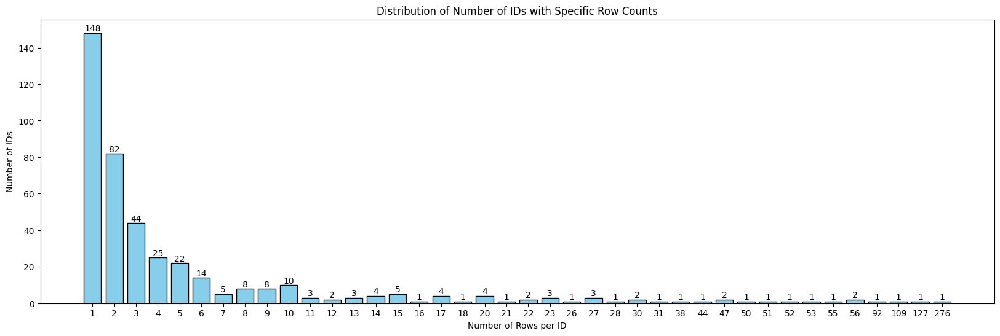

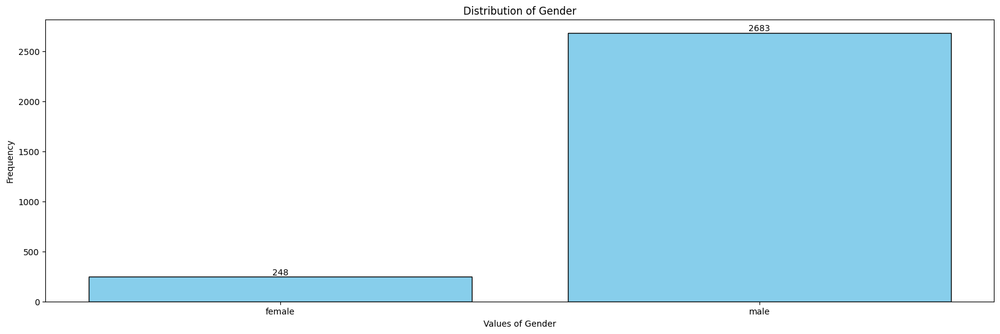

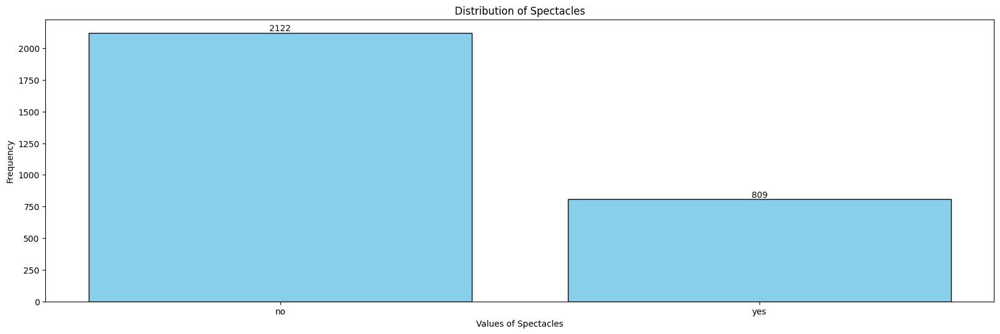

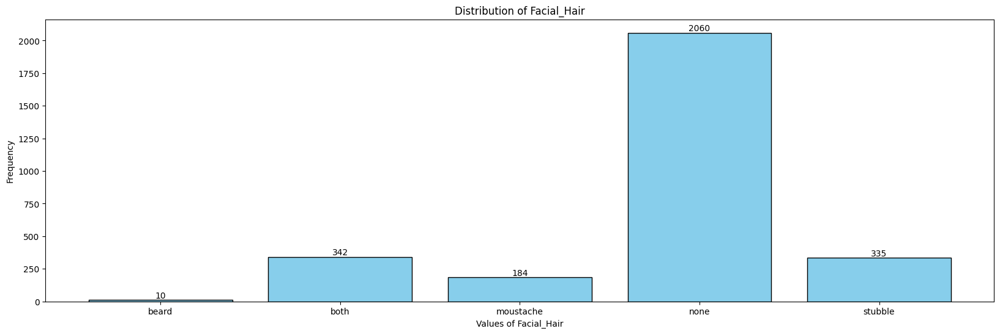

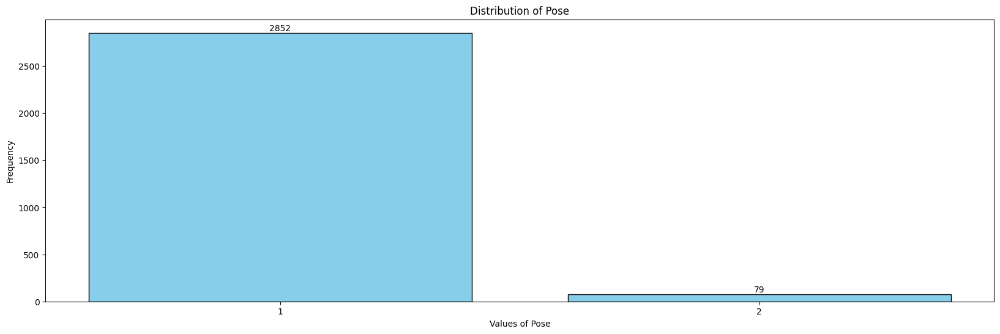

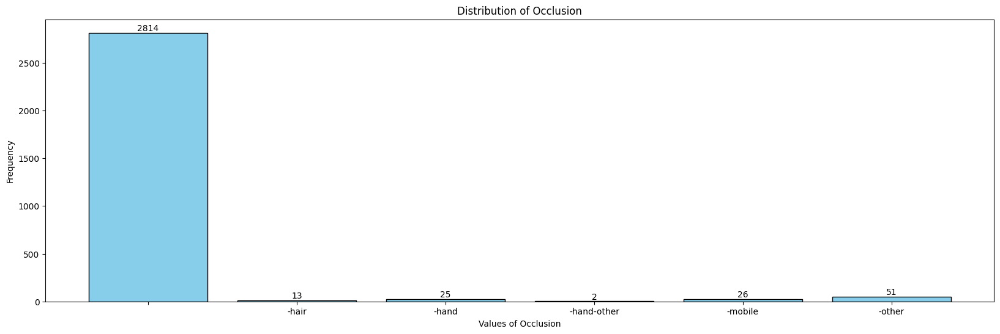

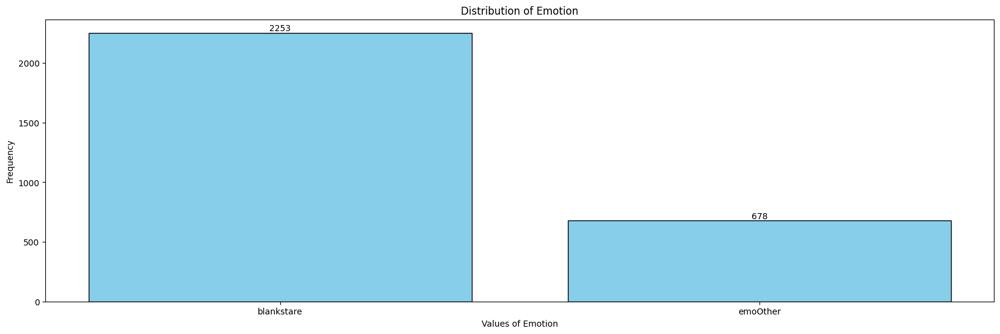

In [196]:
filtered_df.to_csv(output_file, index=False)
headers_to_exclude = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Occlusion', 'Emotion']
analyze_and_plot(output_file, headers_to_exclude)

5. Xem xét về độ bao phủ

Gộp hand và hand-orther thành detect hand.
Cột other bao gồm các ảnh chụp ở ngoài biên, bị che đi hoặc có vật thể lạ. Nhưng lúc train thực hiện random crop lên ko còn chính xác nữa, các vật thể lạ cũng ít (có khi còn mũ bị crop nữa), mtcnn cũng cắt không tốt với đa số các ảnh ngoài biên => Bỏ

Cột mobile thực sự không rõ ràng, có lúc nhìn rõ điện thoại và có lúc không. Đặc điểm nhận diện bên cạnh điện thoại là hình dáng và vị trí của tay khi cầm điện thoại. CNN học rất tốt các đặc trưng cục bộ nhưng không có khả năng học khái quát vị trí trên toàn bộ ảnh => Lọc các ảnh có tay chuyển thành hand và bỏ các ảnh có mobile đi để model dễ nhận diện tay hơn.

In [197]:
# Đọc dữ liệu từ file CSV
df = pd.read_csv(output_file)

filtered_df = df[pd.isna(df['Occlusion'])]

# Xóa cột 'Quality'
filtered_df = filtered_df.drop(columns=['Occlusion'])

Unique values in Gender: ['female', 'male']
Total number of unique values in Gender: 2

Unique values in Spectacles: ['no', 'yes']
Total number of unique values in Spectacles: 2

Unique values in Facial_Hair: ['beard', 'both', 'moustache', 'none', 'stubble']
Total number of unique values in Facial_Hair: 5

Unique values in Pose: ['1', '2']
Total number of unique values in Pose: 2

Unique values in Emotion: ['blankstare', 'emoOther']
Total number of unique values in Emotion: 2



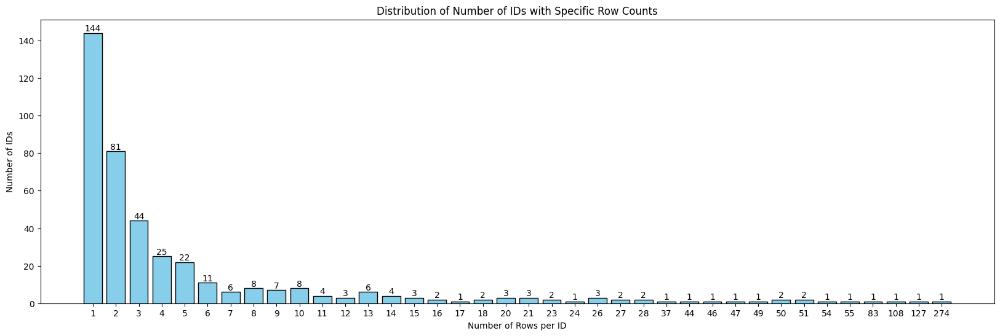

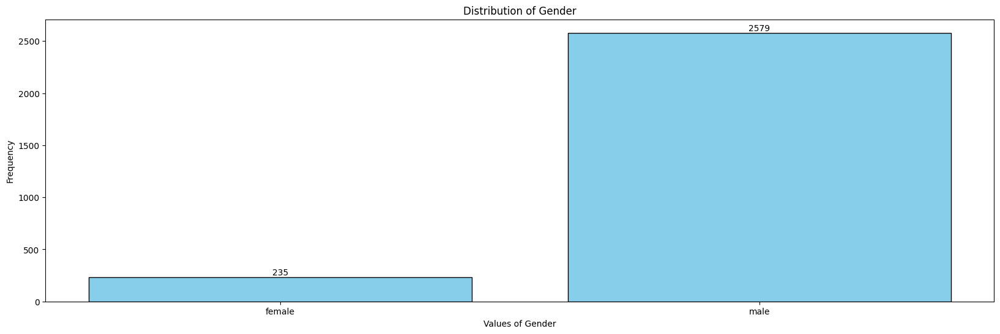

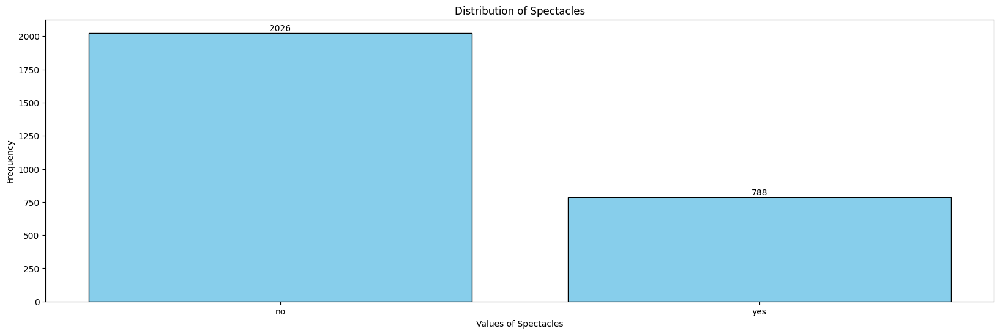

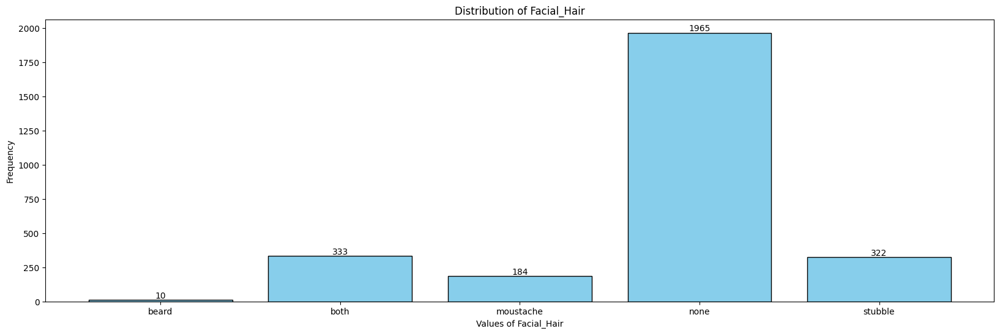

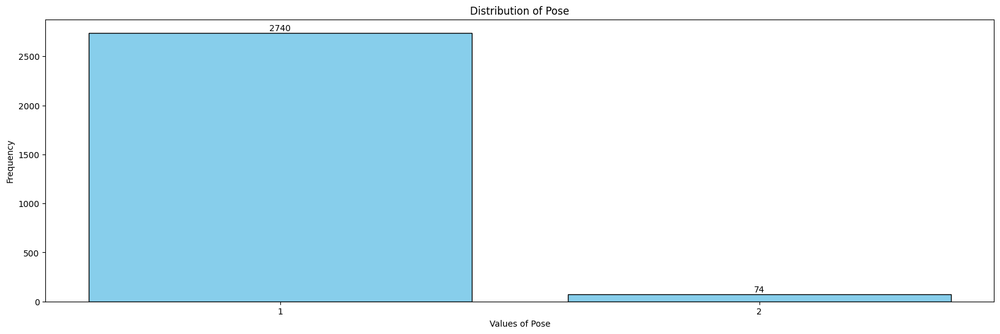

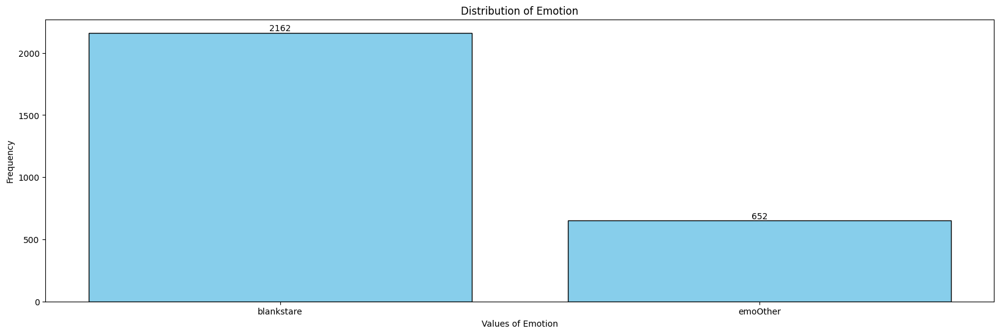

In [198]:
filtered_df.to_csv(output_file, index=False)

# Các header cần xử lý (trừ 'session')
headers_to_exclude = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Emotion']

# Phân tích và vẽ biểu đồ
analyze_and_plot(output_file, headers_to_exclude)

6. Facial hair (lông mặt): Đưa hết lông mặt về một loại là có hoặc không. Như thế giảm thiểu được overfit. Chẳng ai quan trọng lông mặt thế nào cả.

In [199]:
# Đọc dữ liệu từ file CSV
df = pd.read_csv(output_file)

df['Facial_Hair'] = df['Facial_Hair'].replace('beard', 'stubble')

df['Facial_Hair'] = df['Facial_Hair'].replace('both', 'stubble')

df['Facial_Hair'] = df['Facial_Hair'].replace('moustache', 'stubble')

filtered_df = df

Unique values in Gender: ['female', 'male']
Total number of unique values in Gender: 2

Unique values in Spectacles: ['no', 'yes']
Total number of unique values in Spectacles: 2

Unique values in Facial_Hair: ['none', 'stubble']
Total number of unique values in Facial_Hair: 2

Unique values in Pose: ['1', '2']
Total number of unique values in Pose: 2

Unique values in Emotion: ['blankstare', 'emoOther']
Total number of unique values in Emotion: 2



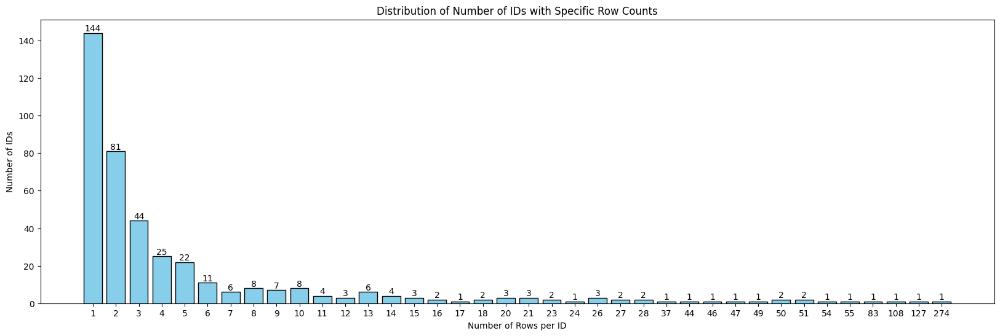

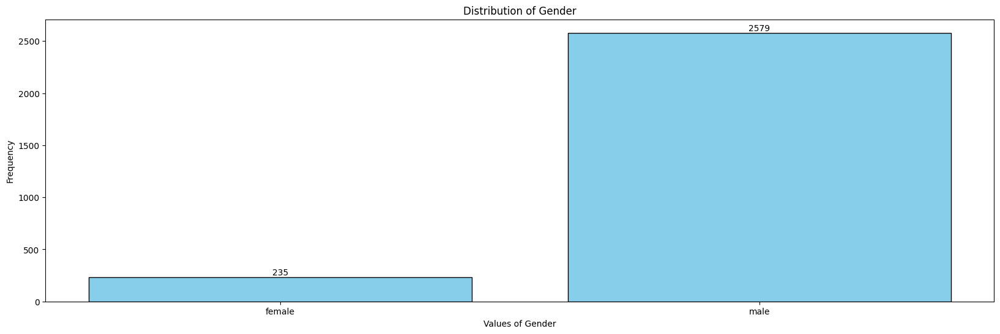

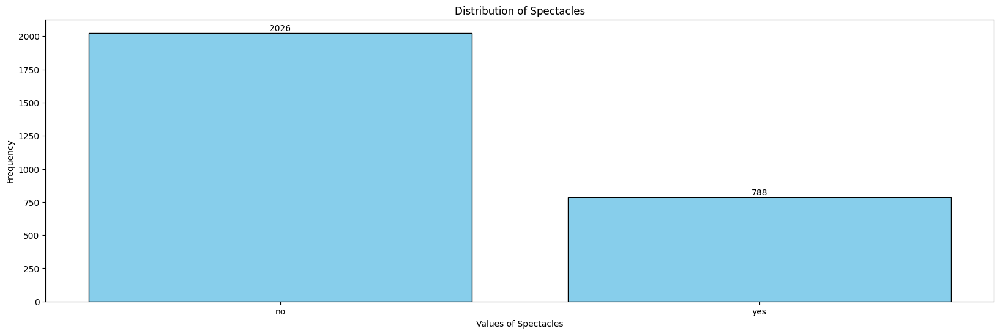

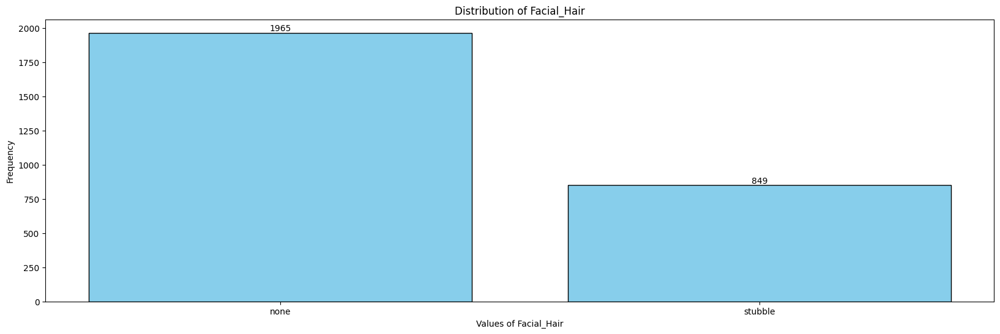

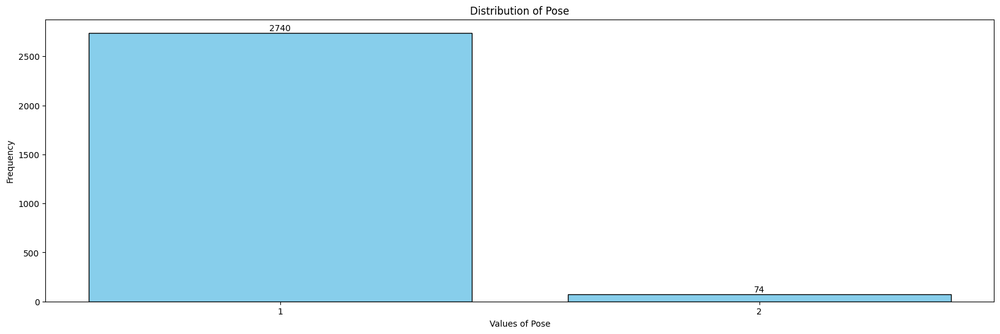

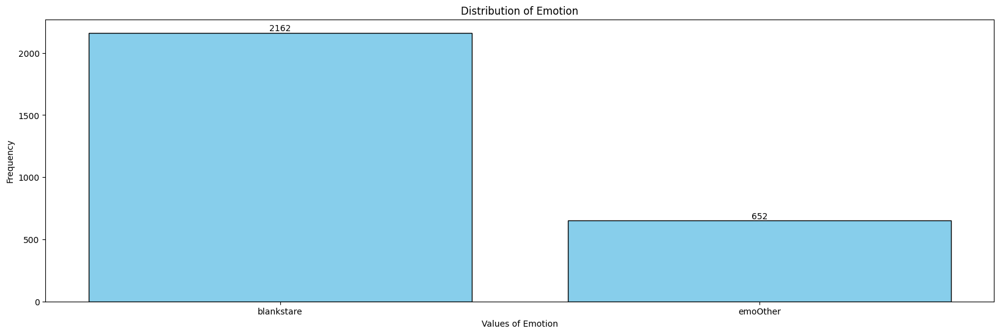

In [200]:
filtered_df.to_csv(output_file, index=False)

# Các header cần xử lý (trừ 'session')
headers_to_exclude = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Emotion']

# Phân tích và vẽ biểu đồ
analyze_and_plot(output_file, headers_to_exclude)

### Label and One hot coding

In [201]:
final_dataset_path = './multi/final_dataset.csv'

In [202]:
# Đọc file CSV và đếm số lượng các loại giá trị duy nhất cho các cột trừ 'id' và 'session'
def count_unique_values(csv_path, headers_to_exclude):
    unique_values_by_column = {header: set() for header in headers_to_exclude}

    with open(csv_path, 'r') as csvfile:
        csv_reader = csv.reader(csvfile)
        headers = next(csv_reader)  # Đọc header
        
        # Lấy chỉ số của các header cần đếm
        for row in csv_reader:
            for header, value in zip(headers, row):
                if header in headers_to_exclude:
                    unique_values_by_column[header].add(value)  # Thêm giá trị duy nhất vào set

    return unique_values_by_column

# Hiển thị số lượng các loại (unique values) có trong từng cột
def display_unique_values(unique_values_by_column):
    for column, unique_values in unique_values_by_column.items():
        print(f"Unique values in {column}: {sorted(unique_values)}")
        print(f"Total number of unique values in {column}: {len(unique_values)}\n")

# Các header cần xử lý (trừ 'id' và 'session')
headers_to_exclude = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Emotion']

# Đếm các loại giá trị duy nhất trong từng cột
unique_values_by_column = count_unique_values(final_dataset_path, headers_to_exclude)

# Hiển thị các loại và số lượng có trong từng cột
display_unique_values(unique_values_by_column)

Unique values in Gender: ['female', 'male']
Total number of unique values in Gender: 2

Unique values in Spectacles: ['no', 'yes']
Total number of unique values in Spectacles: 2

Unique values in Facial_Hair: ['none', 'stubble']
Total number of unique values in Facial_Hair: 2

Unique values in Pose: ['1', '2']
Total number of unique values in Pose: 2

Unique values in Emotion: ['blankstare', 'emoOther']
Total number of unique values in Emotion: 2



In [203]:
from sklearn.preprocessing import LabelEncoder

# Đọc dữ liệu
df = pd.read_csv(final_dataset_path)

# Khởi tạo LabelEncoder
label_encoder = LabelEncoder()

# Các cột cần thực hiện label encoding
columns_to_encode = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Emotion']

# Áp dụng label encoding cho từng cột
for col in columns_to_encode:
    df[col] = label_encoder.fit_transform(df[col])

# Lưu dữ liệu sau khi đã label encoding
df.to_csv('./multi/label_encoded_dataset.csv', index=False)

# In ra một số dòng dữ liệu đã được label encoding
print("Dataset after label encoding:")
df['Gender'].value_counts()

Dataset after label encoding:


Gender
1    2579
0     235
Name: count, dtype: int64

In [66]:
# Đọc dữ liệu
df = pd.read_csv(final_dataset_path)

# Các cột cần one-hot encoding
columns_to_encode = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Occlusion', 'Emotion']

# Thực hiện one-hot encoding
df_encoded = pd.get_dummies(df, columns=columns_to_encode, prefix=columns_to_encode)

# Lưu dữ liệu đã one-hot encoding
df_encoded.to_csv('./multi/encoded_dataset.csv', index=False)

print("Dataset after one-hot encoding:")

Dataset after one-hot encoding:


### Chia dataset cân bằng

In [204]:
final_dataset_path = './multi/label_encoded_dataset.csv'

Unique values in Gender: ['0', '1']
Total number of unique values in Gender: 2

Unique values in Spectacles: ['0', '1']
Total number of unique values in Spectacles: 2

Unique values in Facial_Hair: ['0', '1']
Total number of unique values in Facial_Hair: 2

Unique values in Pose: ['0', '1']
Total number of unique values in Pose: 2

Unique values in Emotion: ['0', '1']
Total number of unique values in Emotion: 2



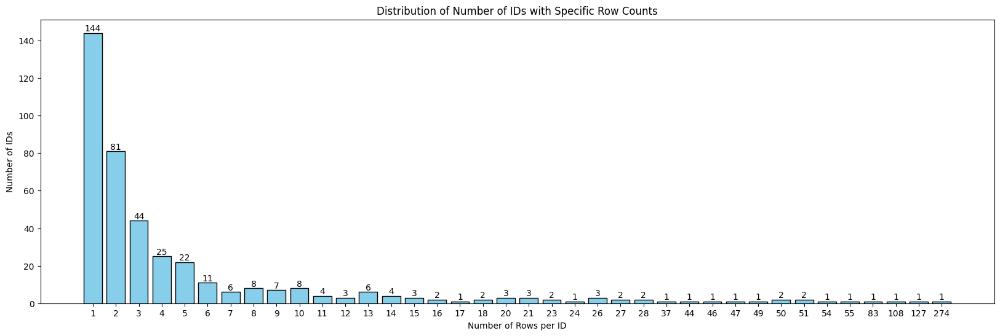

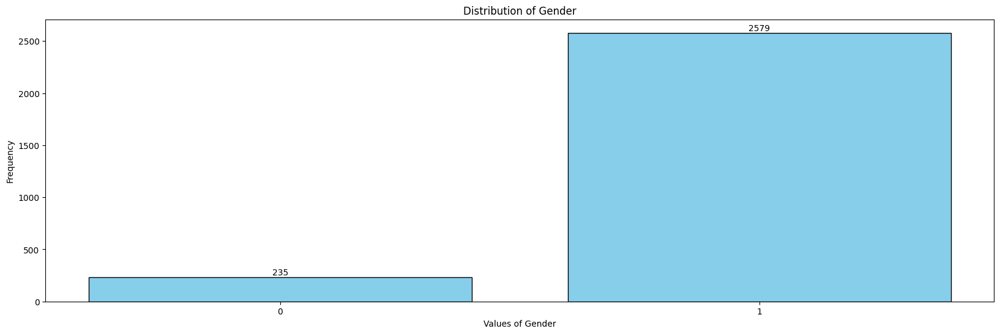

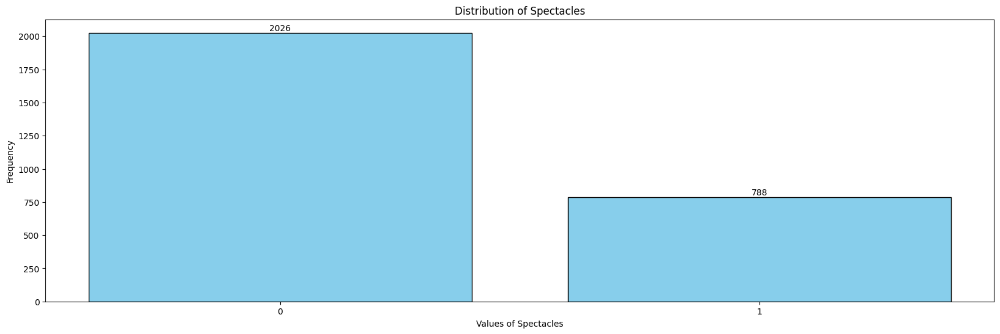

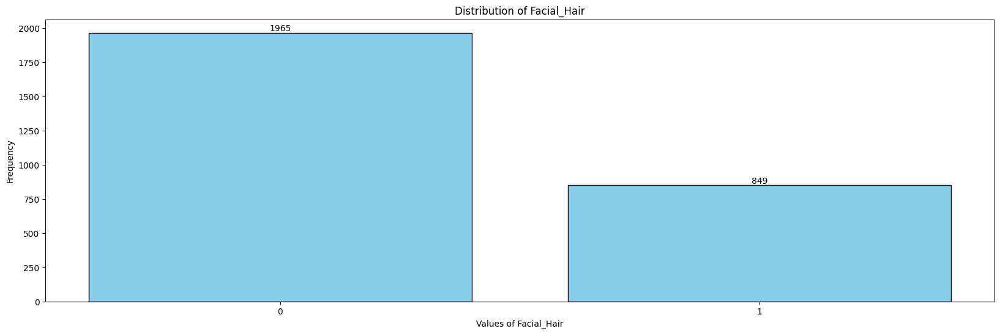

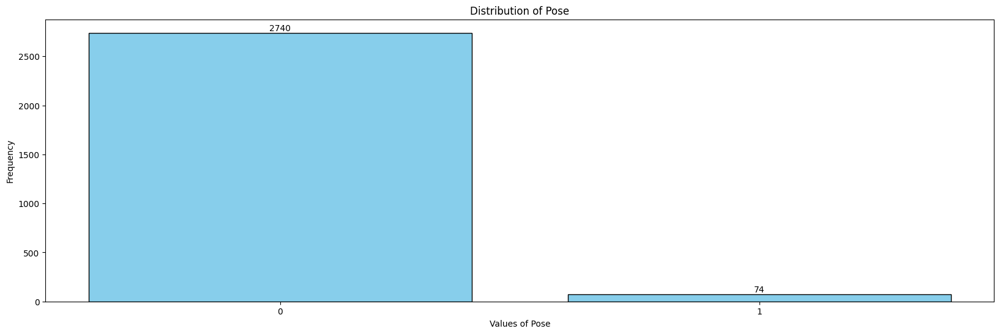

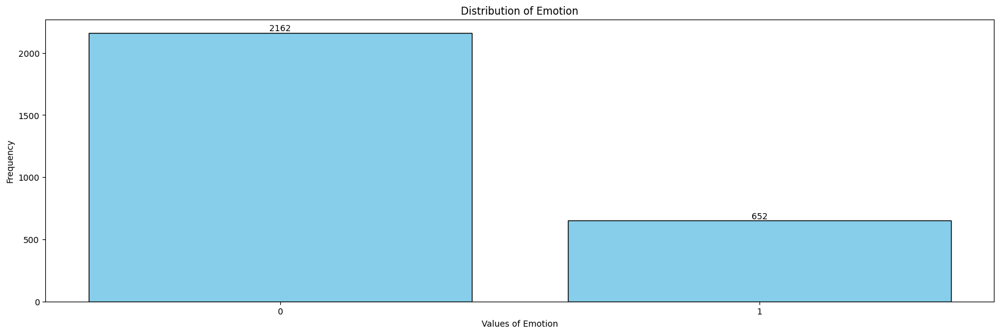

In [205]:
headers_to_exclude = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Emotion']

analyze_and_plot(final_dataset_path, headers_to_exclude)

In [208]:
from sklearn.model_selection import StratifiedGroupKFold, train_test_split

# Đường dẫn file
file_path = './multi/label_encoded_dataset.csv'

# Đọc dữ liệu từ file
dataset = pd.read_csv(file_path)

# Cột nhãn để kiểm tra cân bằng
label_columns = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Emotion']

# Đảm bảo cột 'id' tồn tại
if 'id' not in dataset.columns:
    raise ValueError("Cột 'id' không tồn tại trong dataset!")

# Tạo nhãn tổ hợp để duy trì sự cân bằng trên nhiều chiều
dataset['combined_labels'] = dataset[label_columns].astype(str).agg('_'.join, axis=1)

# Tạo nhóm dựa trên 'id' để duy trì sự không trùng lặp ID
group_kfold = StratifiedGroupKFold(n_splits=3)
splits = list(group_kfold.split(X=dataset, y=dataset['combined_labels'], groups=dataset['id']))

# Tách các tập từ các splits
train_idx, test_gallery_idx = splits[0]  # Lấy split đầu tiên
test_idx, gallery_idx = train_test_split(
    test_gallery_idx, test_size=0.5, random_state=42
)

# Tạo các tập Train, Test, Gallery
train_set = dataset.iloc[train_idx]
test_set = dataset.iloc[test_idx]
gallery_set = dataset.iloc[gallery_idx]

# Hàm tính toán phân phối nhãn theo từng cột
def compute_label_distribution(data, columns):
    return {col: data[col].value_counts(normalize=True).to_dict() for col in columns}

# Kiểm tra sự cân bằng của nhãn
train_distribution = compute_label_distribution(train_set, label_columns)
test_distribution = compute_label_distribution(test_set, label_columns)
gallery_distribution = compute_label_distribution(gallery_set, label_columns)

# Tập hợp kết quả
label_distributions = {
    'Train': train_distribution,
    'Test': test_distribution,
    'Gallery': gallery_distribution
}

# Lưu các tập dữ liệu ra file CSV với thứ tự id
train_set.sort_values(by='id').to_csv('./multi/train_set.csv', index=False)
test_set.sort_values(by='id').to_csv('./multi/test_set.csv', index=False)
gallery_set.sort_values(by='id').to_csv('./multi/gallery_set.csv', index=False)

# In thông tin kết quả
print("Train size:", len(train_set))
print("Test size:", len(test_set))
print("Gallery size:", len(gallery_set))
print("\nLabel distributions:", label_distributions)


Train size: 1876
Test size: 469
Gallery size: 469

Label distributions: {'Train': {'Gender': {1: 0.9184434968017058, 0: 0.08155650319829424}, 'Spectacles': {0: 0.7196162046908315, 1: 0.28038379530916846}, 'Facial_Hair': {0: 0.6961620469083155, 1: 0.30383795309168443}, 'Pose': {0: 0.9754797441364605, 1: 0.024520255863539446}, 'Emotion': {0: 0.7681236673773987, 1: 0.23187633262260127}}, 'Test': {'Gender': {1: 0.9040511727078892, 0: 0.09594882729211088}, 'Spectacles': {0: 0.7334754797441365, 1: 0.26652452025586354}, 'Facial_Hair': {0: 0.6716417910447762, 1: 0.3283582089552239}, 'Pose': {0: 0.9701492537313433, 1: 0.029850746268656716}, 'Emotion': {0: 0.7846481876332623, 1: 0.21535181236673773}}, 'Gallery': {'Gender': {1: 0.9211087420042644, 0: 0.07889125799573561}, 'Spectacles': {0: 0.7078891257995735, 1: 0.2921108742004264}, 'Facial_Hair': {0: 0.7334754797441365, 1: 0.26652452025586354}, 'Pose': {0: 0.9701492537313433, 1: 0.029850746268656716}, 'Emotion': {0: 0.7526652452025586, 1: 0.2473

/home/user3t/miniconda3/envs/doan/lib/python3.10/site-packages/sklearn/model_selection/_split.py:994: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(


In [209]:
def compute_label_distribution(dataset, label_columns):
    distribution = {}
    for label in label_columns:
        counts = dataset[label].value_counts(normalize=True) * 100  # Tính phần trăm
        distribution[label] = counts.to_dict()
    return distribution

label_columns = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Emotion']

# Tính phân phối nhãn
train_distribution = compute_label_distribution(train_set, label_columns)
test_distribution = compute_label_distribution(test_set, label_columns)
gallery_distribution = compute_label_distribution(gallery_set, label_columns)

# Hiển thị kết quả
print("Train Distribution:")
for label, values in train_distribution.items():
    print(f"{label}: {values}")

print("\nTest Distribution:")
for label, values in test_distribution.items():
    print(f"{label}: {values}")

print("\nGallery Distribution:")
for label, values in gallery_distribution.items():
    print(f"{label}: {values}")


Train Distribution:
Gender: {1: 91.84434968017058, 0: 8.155650319829425}
Spectacles: {0: 71.96162046908316, 1: 28.038379530916846}
Facial_Hair: {0: 69.61620469083155, 1: 30.383795309168445}
Pose: {0: 97.54797441364606, 1: 2.4520255863539444}
Emotion: {0: 76.81236673773986, 1: 23.187633262260128}

Test Distribution:
Gender: {1: 90.40511727078892, 0: 9.594882729211088}
Spectacles: {0: 73.34754797441366, 1: 26.652452025586353}
Facial_Hair: {0: 67.16417910447761, 1: 32.83582089552239}
Pose: {0: 97.01492537313433, 1: 2.9850746268656714}
Emotion: {0: 78.46481876332622, 1: 21.535181236673772}

Gallery Distribution:
Gender: {1: 92.11087420042644, 0: 7.889125799573561}
Spectacles: {0: 70.78891257995735, 1: 29.21108742004264}
Facial_Hair: {0: 73.34754797441366, 1: 26.652452025586353}
Pose: {0: 97.01492537313433, 1: 2.9850746268656714}
Emotion: {0: 75.26652452025586, 1: 24.733475479744136}


Unique values in Gender: ['0', '1']
Total number of unique values in Gender: 2

Unique values in Spectacles: ['0', '1']
Total number of unique values in Spectacles: 2

Unique values in Facial_Hair: ['0', '1']
Total number of unique values in Facial_Hair: 2

Unique values in Pose: ['0', '1']
Total number of unique values in Pose: 2

Unique values in Emotion: ['0', '1']
Total number of unique values in Emotion: 2



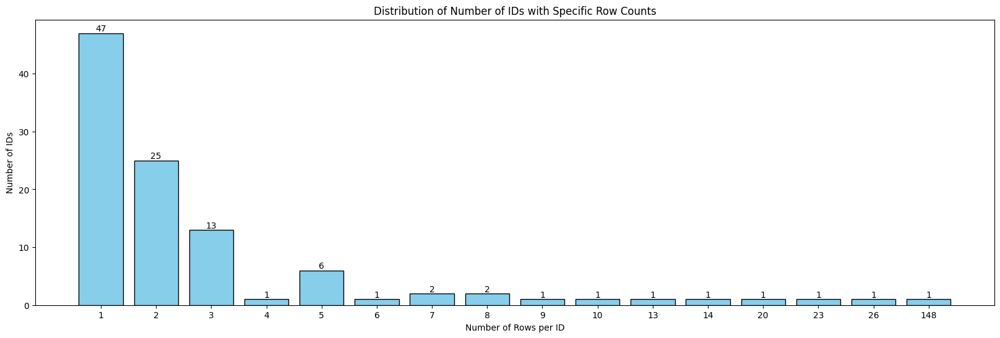

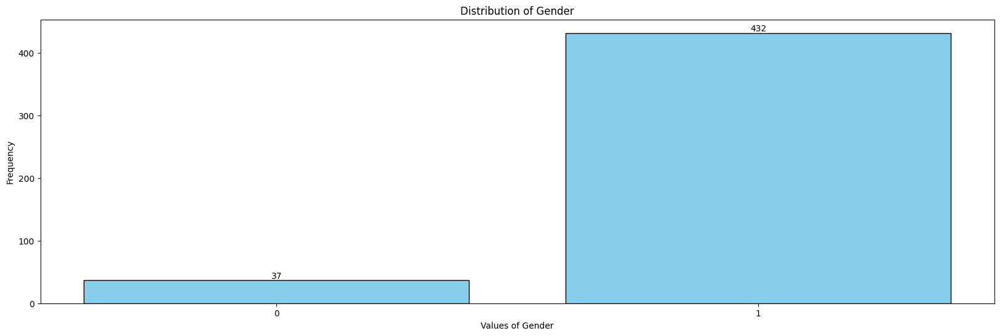

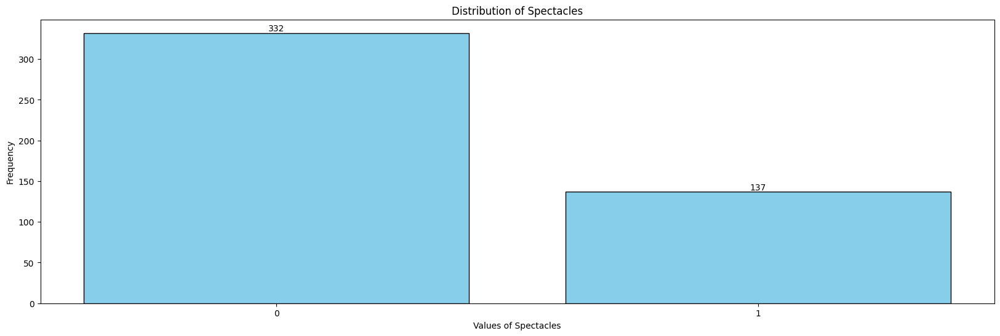

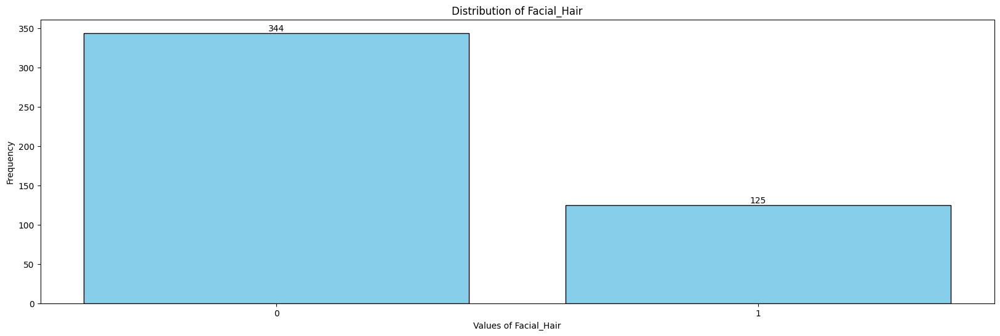

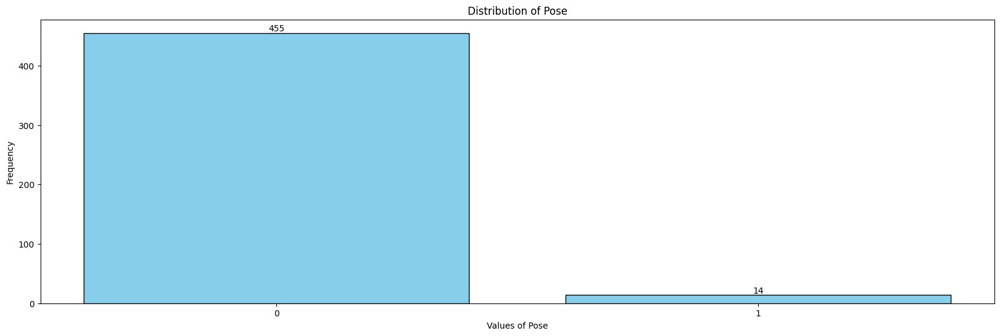

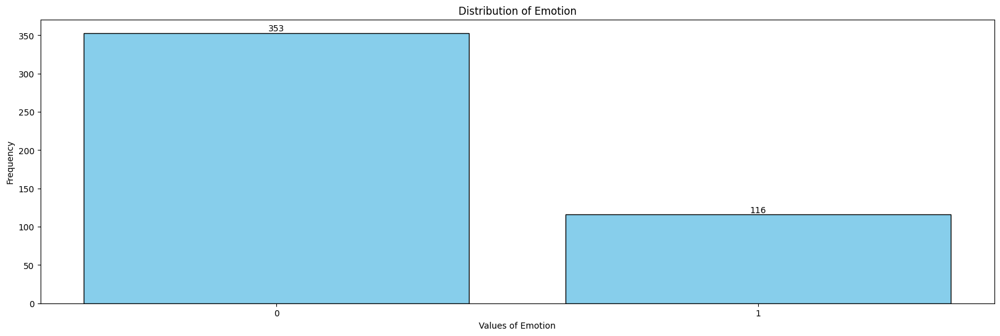

In [210]:
headers_to_exclude = ['Gender', 'Spectacles', 'Facial_Hair', 'Pose', 'Emotion']

analyze_and_plot('./multi/gallery_set.csv', headers_to_exclude)

## Tạo dataset

In [212]:
photometric_db = '../Photometric_DB'
dest_folder = '../Dataset'

train_file = './multi/train_set.csv'
test_file = './multi/test_set.csv'
gallery_file = './multi/gallery_set.csv'

shutil.copy(train_file, dest_folder)
shutil.copy(test_file, dest_folder)
shutil.copy(gallery_file, dest_folder)

albedo_train_dest_folder = os.path.join(dest_folder, 'Albedo', 'train')
albedo_test_dest_folder = os.path.join(dest_folder, 'Albedo', 'test')
albedo_gallery_dest_folder = os.path.join(dest_folder, 'Albedo', 'gallery')

normalmap_train_dest_folder = os.path.join(dest_folder, 'Normal_Map', 'train')
normalmap_test_dest_folder = os.path.join(dest_folder, 'Normal_Map', 'test')
normalmap_gallery_dest_folder = os.path.join(dest_folder, 'Normal_Map', 'gallery')

depthmap_train_dest_folder = os.path.join(dest_folder, 'Depth_Map', 'train')
depthmap_test_dest_folder = os.path.join(dest_folder, 'Depth_Map', 'test')
depthmap_gallery_dest_folder = os.path.join(dest_folder, 'Depth_Map', 'gallery')

os.makedirs(dest_folder, exist_ok=True)
os.makedirs(albedo_train_dest_folder, exist_ok=True)
os.makedirs(albedo_test_dest_folder, exist_ok=True)
os.makedirs(albedo_gallery_dest_folder, exist_ok=True)
os.makedirs(normalmap_train_dest_folder, exist_ok=True)
os.makedirs(normalmap_test_dest_folder, exist_ok=True)
os.makedirs(normalmap_gallery_dest_folder, exist_ok=True)
os.makedirs(depthmap_train_dest_folder, exist_ok=True)
os.makedirs(depthmap_test_dest_folder, exist_ok=True)
os.makedirs(depthmap_gallery_dest_folder, exist_ok=True)


# Hàm sao chép file
def copy_file(source_session_path, new_id_folder_paths, session):
    new_id_albedo_folder_path, new_id_normal_map_folder_path, new_id_depth_map_folder_path = new_id_folder_paths
    
    albedo_filename = 'albedo_mtcnn.exr'
    normal_map_filename = 'normalmap_mtcnn.exr'
    depth_map_filename = 'depthmap_mtcnn.exr'
    
    source_albedo_path = os.path.join(source_session_path, albedo_filename)
    source_normal_map_path = os.path.join(source_session_path, normal_map_filename)
    source_depth_map_path = os.path.join(source_session_path, depth_map_filename)
    
    destination_albedo_path = os.path.join(new_id_albedo_folder_path, f"{session}.exr")
    destination_normal_map_path = os.path.join(new_id_normal_map_folder_path, f"{session}.exr")
    destination_depth_map_path = os.path.join(new_id_depth_map_folder_path, f"{session}.exr")
    
    shutil.copy(source_albedo_path, destination_albedo_path)
    shutil.copy(source_normal_map_path, destination_normal_map_path)
    shutil.copy(source_depth_map_path, destination_depth_map_path)

# Hàm xử lý từng hàng
def process_row(row, photometric_db, albedo_dest_folder, normal_map_dest_folder, depth_map_dest_folder):
    id = str(row['id'])
    session = row['session']
    
    id_path = os.path.join(photometric_db, id)
    new_id_albedo_folder_path = os.path.join(albedo_dest_folder, id)
    new_id_normal_map_folder_path = os.path.join(normal_map_dest_folder, id)
    new_id_depth_map_folder_path = os.path.join(depth_map_dest_folder, id)
    new_id_folder_paths = [new_id_albedo_folder_path, new_id_normal_map_folder_path, new_id_depth_map_folder_path]
    
    # Tạo thư mục nếu chưa tồn tại
    for folder in new_id_folder_paths:
        os.makedirs(folder, exist_ok=True)
    
    source_session_path = os.path.join(id_path, session)
    copy_file(source_session_path, new_id_folder_paths, session)

# Đọc các tệp CSV
train_df = pd.read_csv(train_file)
test_df = pd.read_csv(test_file)
gallery_df = pd.read_csv(gallery_file)

# Sử dụng ProcessPoolExecutor để sao chép file từ các session path hợp lệ
with ProcessPoolExecutor() as executor:
    futures = []
    for _, row in train_df.iterrows():  # Duyệt qua từng hàng trong DataFrame
        futures.append(
            executor.submit(
                process_row,
                row,
                photometric_db,
                albedo_train_dest_folder,
                normalmap_train_dest_folder,
                depthmap_train_dest_folder
            )
        )
    
    for _, row in test_df.iterrows():  # Duyệt qua từng hàng trong DataFrame
        futures.append(
            executor.submit(
                process_row,
                row,
                photometric_db,
                albedo_test_dest_folder,
                normalmap_test_dest_folder,
                depthmap_test_dest_folder
            )
        )
    
    for _, row in gallery_df.iterrows():  # Duyệt qua từng hàng trong DataFrame
        futures.append(
            executor.submit(
                process_row,
                row,
                photometric_db,
                albedo_gallery_dest_folder,
                normalmap_gallery_dest_folder,
                depthmap_gallery_dest_folder
            )
        )
        
    # Đợi tất cả các tác vụ sao chép hoàn thành
    for future in as_completed(futures):
        try:
            future.result()  # Xử lý ngoại lệ nếu có
        except Exception as e:
            print(f"Lỗi khi sao chép file: {e}")

# Summary

Trong notebook này, em đã thực hiện:

0. Hiểu dữ liệu 
1. Gen các ảnh chứa thông tin 3D như normal map, depth map và albedo bằng phương pháp photometric streo.
2. Thực hiện face aligment bằng cách sử dụng mtcnn để detect face trong image và adjust lại box của mtcnn sao cho ảnh có kích thước (448, 336) và điểu chỉnh ảnh crop sao cho phù hợp, scale up nếu ảnh ban đầu không đủ kích thước và sử dụng các phép nội suy thích hợp để suy diễn các pixel còn thiếu.
    - Có 3 session mtcnn không detect được và 1 trường hợp khó thuật toán của em detect lỗi. Các trường hợp này phải thực hiện crop lại bằng tay
    - Có 13 session cho ảnh bị lỗi albedo, normal map, depth map. Ảnh quá tối, che khuất quá nhiều, ... và phải bỏ
    - Kích thước toàn dataset giảm mạnh từ 100 GB về 9,2GB dữ liệu 3D. Trong đó dữ liệu albedo và depthmap là 1,9 GB còn dữ liệu normal map là chứa 9,5 GB
3. Chia tập dữ liệu thành train và test với tỷ lệ 8:2
4. Bước tiếp theo em sẽ thực hiện train 3 mạng neutron để tạo ra các embedding tương ứng của 3 loại dữ liệu 3D.
    - Train 1 model có khả năng trích xuất embedding chứa thông tin danh tính của normal map. Emdedding này cung cấp thông tin danh tính về hình dạng bề mặt của mặt người như độ gồ ghề, lồi lõm, pose, ... mà ảnh 2D không thể hiện được.
    - Train 1 model có khả năng trích xuất embedding chứa thông tin danh tính của depth map. Emdedding này cung cấp thông tin danh tính về hình dạng không gian và độ sâu các điểm trên bề mặt mặt người.
    - Train 1 model có khả năng trích xuất embedding chứa thông tin danh tính của albedo.Emdedding này cung cấp thông tin danh tính về độ phản chiếu ánh sáng hay màu sắc, kết cấu và đặc trưng vật liệu của từng điểm trên khuôn mặt. Nó không bị ảnh hưởng bởi ánh sáng.
    - Cuối cùng sẽ là 1 model để fusion các embedding trên. Sau cùng mạng neutron thu được có khả năng dung hòa những lợi ích mà các embedding trên có thể mang lại. Model sẽ có khả năng nhận diện được hình dạng bề mặt, pose, không bị ảnh hưởng bởi hướng chiếu sáng, ... mà những model 2D truyền thống không thể xử lý, trích xuất được. Từ đó cho ra hiệu suất Face Recognition tốt hơn.
    - Bước này em sẽ thực hiện những công nghệ tốt nhất dựa theo research : https://arxiv.org/pdf/2212.13038